In [1]:






# 제목             - P
# 글 작성 일자     - Q (예:20220504143118 : 2022년 5월 4일 14시 31분 18초)
# 게시물 ID        - R
# 질의 내용        - T
# 질의 요약        - AD
# 답변 내용        - AE
# 답변 요약        - AF
# 담당 부서        - AH

In [2]:
# Excel 읽어오기

import pandas as pd
file = pd.read_excel("./국민신문고(14_220515).xlsx", header=0, usecols="Q, R, T, AE, AH")

In [3]:
# 사고 예방 심사 2과만 추출 
# 실행 안하면 전체

file = file.loc[file['Column1.dep_name'] == '사고예방심사2과'] 
file = file.reset_index()
file = file.drop(columns='index')
file

,Column1.create_date,Column1.doc_id,Column1.content,Column1.prcs_cntn,Column1.dep_name
0,20220307170647,1AA-2203-0200863,안녕하세요.\n제목과 같이 유해화학물질 운반차량에 대한 설치검사를 받고자 하는데 문...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원(신청번호: 1AA-2...,사고예방심사2과
1,20220310170014,1AA-2203-0293064,위험물(4류) 허가 창고입니다.[단순 보관업] \n\n이번 신규 물질로 4류 위험...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원에대한 검토 결과를 다음...,사고예방심사2과
2,20220312221753,1AA-2203-0362804,「사외배관 이송시설 설치 및 관리에 관한 고시」 3-가-1)과 세부기준 1)-1과 ...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원(신청번호: 1AA-2...,사고예방심사2과
3,20220311113539,1AA-2203-0313674,안녕하십니까 화학물질관리법의 안전밸브 설치규정과 관련하여 문의드립니다. \n\n저희...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원에대한 검토 결과를 다...,사고예방심사2과
4,20220311153809,1AA-2203-0322203,환경부의 일반민원 유권해석 중 몇몇 답변은 상반되어 현장에서 혼란이 발생(환경부의 ...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원(신청번호: 1AA-2...,사고예방심사2과
...,...,...,...,...,...
4280,20211215140053,1AA-2112-0479934,"안녕하세요, 화관법 설치기준 문의드립니다.\n\n""액체 유해화학물질 제조사용시설의 ...",1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원(신청번호1AA-211...,사고예방심사2과
4281,20211210015948,1AA-2112-0299824,안녕하세요. 압력용기용 안전밸브와 관련하여 유해화학물질 취급시설 검사기준을 질의드리...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원에대한 검토 결과를 다음...,사고예방심사2과
4282,20211216110711,1AA-2112-0508202,안녕하십니까? 엔솔엔지니어링㈜ 공정팀의 장세환 차장입니다..\n\n저희는 현재 헥사...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원에대한 검토 결과를 다...,사고예방심사2과
4283,20211125154546,1AA-2111-0806294,"당사는 과산화수소 32%를 사용하는 타올및 실을 염색가공하는 업체이며, 화학물질관리...",민원인이 취하를 요청하여 취하처리하고 자체 종결 함,사고예방심사2과


In [4]:
#작성 일자 전처리

# 기존 형식 - 20220504143118 : 2022년 5월 4일 14시 31분 18초 
# 날짜만 추출 20220504143118 -> 2022-05-04


# 20220504143118 -> 20220504 로 변환 (INT)
for i in range(len(file)): 
    
        temp_create_date = file.loc[i,'Column1.create_date'] #작성 일자 추출
        if len(str(temp_create_date)) == 14 :
            temp_create_date = (round(temp_create_date/1000000))   #일까지만 살림
            file.loc[i,'Column1.create_date'] = temp_create_date


# 20220504 -> 2022-05-04 로 변환
file["Column1.create_date"] = file["Column1.create_date"].apply(lambda x: pd.to_datetime(str(x), format='%Y-%m-%d'))
    
file["Column1.create_date"]


0      2022-03-07
1      2022-03-10
2      2022-03-12
3      2022-03-11
4      2022-03-11
          ...    
4280   2021-12-15
4281   2021-12-10
4282   2021-12-16
4283   2021-11-25
4284   2021-12-29
Name: Column1.create_date, Length: 4285, dtype: datetime64[ns]

In [5]:
# 정규화 처리 함수
# txt 파일 구분선 [---]
# 매개 변수 f -> .txt FILE
# 매개 변수 s -> string contents (str 형식)
import re

def normalization(f,s) :
    
    lines = f.readlines()
    for line in lines:
        line = line.strip()  # 줄 끝의 줄 바꿈 문자를 제거한다.
        
        if re.search('---',line) is not None :
            A = re.search('.*---',line).group().replace('---','') # 변경할 문자
            B = re.search('---.*',line).group().replace('---','') # 변경될 문자
            #print(A+' '+B)
            s = s.replace(A,B)
    return s


In [6]:
# 질의 내용 전처리

file["Column1.content"]= file["Column1.content"].str.replace("\n","") # \n 개행문자 제거

#단어 정규화 - 같은 의미 단어 통합
for i in range(len(file)): 
    
    temp_content = file.loc[i,'Column1.content']

    f = open("./단어_정규화_목록.txt", 'r', encoding='UTF8')    
    content = normalization(f,temp_content)
    f.close()
    
    file.loc[i,'Column1.content'] = content
    

file["Column1.content"]

0       안녕하세요.제목과 같이 유해화학물질 운송차량에 대한 설치검사를 받고자 하는데 문의가...
1        위험물(4류) 허가 창고입니다.[단순 보관업] 이번 신규 물질로 4류 위험물 이면...
2       「사외배관 이송시설 설치 및 관리에 관한 고시」 3-가-1)과 세부기준 1)-1과 ...
3       안녕하십니까 화학물질관리법의 안전밸브 설치규정과 관련하여 문의드립니다. 저희 사업장...
4       환경부의 일반민원 유권해석 중 몇몇 답변은 상반되어 현장에서 혼란이 발생(환경부의 ...
                              ...                        
4280    안녕하세요, 화학물질관리법 설치기준 문의드립니다."액체 유해화학물질 제조사용시설의 ...
4281    안녕하세요. 압력용기용 안전밸브와 관련하여 유해화학물질 취급시설 검사기준을 질의드리...
4282    안녕하십니까? 엔솔엔지니어링㈜ 공정팀의 장세환 차장입니다..저희는 현재 헥사플루오로...
4283    당사는 과산화수소 32%를 사용하는 타올및 실을 염색가공하는 업체이며, 화학물질관리...
4284    유해화학물질 운송관련 문의(설치검사)차량운송업- 내용 -1. 산화니켈(유해화학물질)...
Name: Column1.content, Length: 4285, dtype: object

In [7]:
#답변이 없는 경우 NUll -> 공백 처리
file["Column1.prcs_cntn"] = file["Column1.prcs_cntn"].str.replace("\n","") # \n 제거 

for i in range(len(file)):
    if str(file.loc[i,'Column1.prcs_cntn']) is None : 
        file.loc[i,'Column1.prcs_cntn'] = ''

In [217]:
gosi_list = []
f = open("./취급시설_고시_목록.txt", 'r', encoding='UTF8')    
lines = f.readlines()
gosi_str = ''
for line in lines:
    line = line.strip()  # 줄 끝의 줄 바꿈 문자를 제거한다.    
    if re.search('---',line) is not None :
            gosis = line.split('---')
            gosi_list.append(gosis[0])

gosi_list

['안전원고시 제2020-7호[고시]',
 '안전원고시 제2020-6호[고시]',
 '안전원고시 제2020-9호[고시]',
 '안전원고시 제2020-8호[고시]',
 '안전원고시 제2020-5호[고시]',
 '안전원고시 제2020-10호[고시]',
 '안전원고시 제2019-11호[고시]',
 '안전원고시 제2020-11호[고시]',
 '안전원고시 제2020-12호[고시]',
 '안전원고시 제2021-2호[고시]',
 '안전원고시 제2021-3호[고시]',
 '안전원고시 제2022-2호[고시]',
 '안전원고시 제2021-5호[고시]',
 '안전원고시 제2021-1호[고시]',
 '안전원고시 제2021-7호[규정]',
 '안전원고시 제2021-2호[규정]',
 '안전원고시 제2021-3호[규정]',
 '안전원고시 제2021-8호[규정]',
 '안전원고시 제2021-9호[규정]',
 '장외영향평가서 작성 등에 관한 규정',
 '위해관리계획서 작성 등에 관한 규정']

In [9]:
gosi_df = pd.DataFrame(columns=['gosi'])
counting_gosi = 0
for i in range(len(file)):
    content_Text = file.loc[i,"Column1.content"] #질문 추출
    prcs_cntn_Text = str(file.loc[i,'Column1.prcs_cntn']) #답변 추출
        
    prcs_cntn_Text = prcs_cntn_Text +' '+content_Text
    
    if '고시' in prcs_cntn_Text :
        counting_gosi += 1
    gosi_list = []
    
    #고시 추출
    f = open("./취급시설_고시_목록.txt", 'r', encoding='UTF8')    
    lines = f.readlines()
    gosi_str = ''
    for line in lines:
        
        flag = 0
        
        line = line.strip()  # 줄 끝의 줄 바꿈 문자를 제거한다.
        
        if re.search('---',line) is not None :
            gosis = line.split('---')
    #        print(gosis)
#            temp_df = pd.DataFrame(columns=[gosis[0]])

            for gosi in gosis :
                if gosi in prcs_cntn_Text : # 하나라도 만족하는 것이 있다면
                    flag += 1
            
            
            #
        
        
        if flag > 1 :
            gosi_list.append(gosis[0])
            #print(gosis[0])

    #len(gosi_list)
    gosi_str = ', '.join(gosi_list)
    gosi_df = pd.concat([gosi_df,pd.DataFrame({'gosi':[gosi_str]})], ignore_index=True)
    
    
file.loc[:,'gosi'] = gosi_df

#print(counting_gosi)
gosi_lists=gosi_df['gosi'].unique()
gosi_df

,gosi
0,안전원고시 제2019-11호[고시]
1,안전원고시 제2020-7호[고시]
2,안전원고시 제2020-12호[고시]
3,
4,"안전원고시 제2020-8호[고시], 안전원고시 제2020-5호[고시]"
...,...
4280,안전원고시 제2020-5호[고시]
4281,
4282,안전원고시 제2020-5호[고시]
4283,


In [218]:
gosi_list

['안전원고시 제2020-7호[고시]',
 '안전원고시 제2020-6호[고시]',
 '안전원고시 제2020-9호[고시]',
 '안전원고시 제2020-8호[고시]',
 '안전원고시 제2020-5호[고시]',
 '안전원고시 제2020-10호[고시]',
 '안전원고시 제2019-11호[고시]',
 '안전원고시 제2020-11호[고시]',
 '안전원고시 제2020-12호[고시]',
 '안전원고시 제2021-2호[고시]',
 '안전원고시 제2021-3호[고시]',
 '안전원고시 제2022-2호[고시]',
 '안전원고시 제2021-5호[고시]',
 '안전원고시 제2021-1호[고시]',
 '안전원고시 제2021-7호[규정]',
 '안전원고시 제2021-2호[규정]',
 '안전원고시 제2021-3호[규정]',
 '안전원고시 제2021-8호[규정]',
 '안전원고시 제2021-9호[규정]',
 '장외영향평가서 작성 등에 관한 규정',
 '위해관리계획서 작성 등에 관한 규정']

In [10]:
substance_df = pd.DataFrame(columns=['substance'])
for i in range(len(file)):
    content_Text = file.loc[i,"Column1.content"] #질문 추출
    prcs_cntn_Text = str(file.loc[i,'Column1.prcs_cntn']) #답변 추출
        
    prcs_cntn_Text = prcs_cntn_Text +' '+content_Text
        
    substance_list = []
    
    #고시 추출
    f = open("./화학물질_목록.txt", 'r', encoding='UTF8')    
    lines = f.readlines()
    
    for line in lines:
        
        flag = 0
        
        line = line.strip()  # 줄 끝의 줄 바꿈 문자를 제거한다.

        if line in prcs_cntn_Text :
            substance_list.append(line)
            
        
    
        substance_str = ', '.join(substance_list)
    
    substance_df = pd.concat([substance_df,pd.DataFrame({'substance':[substance_str]})], ignore_index=True)
        
#기존 file 과 결합
file.loc[:,'substance'] = substance_df

substance_lists=substance_df['substance'].unique()

substance_df

,substance
0,니코틴
1,"독물, 유독물질"
2,
3,
4,"인화성물질, 혼합물"
...,...
4280,
4281,냉각수
4282,"가연성물질, 독물, 부타디엔, 유독물질"
4283,"과산화수소, 배수, 산화수, 폐수"


In [11]:
facility_df = pd.DataFrame(columns=['facility'])
for i in range(len(file)):
    content_Text = file.loc[i,"Column1.content"] #질문 추출
    prcs_cntn_Text = str(file.loc[i,'Column1.prcs_cntn']) #답변 추출
        
    prcs_cntn_Text = prcs_cntn_Text +' '+content_Text
        
    
    facility_list = []
    
    #고시 추출
    f = open("./취급시설_목록.txt", 'r', encoding='UTF8')    
    lines = f.readlines()
    facility_str = ''
    for line in lines:
        
        flag = 0
        
        line = line.strip()  # 줄 끝의 줄 바꿈 문자를 제거한다.

        if line in prcs_cntn_Text :
            facility_list.append(line)
            
        facility_str = ', '.join(facility_list)
    
    facility_df = pd.concat([facility_df,pd.DataFrame({'facility':[facility_str]})], ignore_index=True)

#기존 file 과 결합
file.loc[:,'facility'] = facility_df

facility_lists=facility_df['facility'].unique()
    
facility_df   

,facility
0,"승용자동차, 승합자동차, 운반차량, 운송차량, 차량, 화물자동차"
1,"방지턱, 창고, 트렌치"
2,"도로, 방류벽, 배관, 밸브, 사외배관, 수도, 저장탱크, 탱크, 하천"
3,"배관, 밸브"
4,"감지기, 배관, 배출덕트, 밸브, 송풍기, 수도, 스크러버, 용기, 후드"
...,...
4280,"방지턱, 벽체, 지하, 집수시설, 트렌치"
4281,"밸브, 용기, 지하"
4282,"도로, 외벽, 용기"
4283,"수도, 탱크, 탱크로리"


In [12]:
manager_df = pd.DataFrame(columns=['manager'])
for i in range(len(file)):
    content_Text = file.loc[i,"Column1.content"] #질문 추출
    prcs_cntn_Text = str(file.loc[i,'Column1.prcs_cntn']) #답변 추출
        
    prcs_cntn_Text = prcs_cntn_Text +' '+content_Text
        
    
    manager_list = []
    
    #고시 추출
    f = open("./담당자_목록.txt", 'r', encoding='UTF8')    
    lines = f.readlines()
    manager_str = ''
    for line in lines:
        
        flag = 0
        
        line = line.strip()  # 줄 끝의 줄 바꿈 문자를 제거한다.

        if line in prcs_cntn_Text :
            manager_list.append(line)
            
        manager_str = ', '.join(manager_list)
    
    manager_df = pd.concat([manager_df,pd.DataFrame({'manager':[manager_str]})], ignore_index=True)

#기존 file 과 결합
file.loc[:,'manager'] = manager_df

print(manager_df['manager'].count())   
print(len([x for x in manager_df['manager'] if len(x) > 0]))


manager_lists=manager_df['manager'].unique()

manager_df

4285
3963


,manager
0,이선민
1,정인희
2,이선민
3,정인희
4,이선민
...,...
4280,신은수
4281,곽솔림
4282,정재형
4283,


In [13]:
file

,Column1.create_date,Column1.doc_id,Column1.content,Column1.prcs_cntn,Column1.dep_name,gosi,substance,facility,manager
0,2022-03-07,1AA-2203-0200863,안녕하세요.제목과 같이 유해화학물질 운송차량에 대한 설치검사를 받고자 하는데 문의가...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원(신청번호: 1AA-2...,사고예방심사2과,안전원고시 제2019-11호[고시],니코틴,"승용자동차, 승합자동차, 운반차량, 운송차량, 차량, 화물자동차",이선민
1,2022-03-10,1AA-2203-0293064,위험물(4류) 허가 창고입니다.[단순 보관업] 이번 신규 물질로 4류 위험물 이면...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원에대한 검토 결과를 다음...,사고예방심사2과,안전원고시 제2020-7호[고시],"독물, 유독물질","방지턱, 창고, 트렌치",정인희
2,2022-03-12,1AA-2203-0362804,「사외배관 이송시설 설치 및 관리에 관한 고시」 3-가-1)과 세부기준 1)-1과 ...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원(신청번호: 1AA-2...,사고예방심사2과,안전원고시 제2020-12호[고시],,"도로, 방류벽, 배관, 밸브, 사외배관, 수도, 저장탱크, 탱크, 하천",이선민
3,2022-03-11,1AA-2203-0313674,안녕하십니까 화학물질관리법의 안전밸브 설치규정과 관련하여 문의드립니다. 저희 사업장...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원에대한 검토 결과를 다...,사고예방심사2과,,,"배관, 밸브",정인희
4,2022-03-11,1AA-2203-0322203,환경부의 일반민원 유권해석 중 몇몇 답변은 상반되어 현장에서 혼란이 발생(환경부의 ...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원(신청번호: 1AA-2...,사고예방심사2과,"안전원고시 제2020-8호[고시], 안전원고시 제2020-5호[고시]","인화성물질, 혼합물","감지기, 배관, 배출덕트, 밸브, 송풍기, 수도, 스크러버, 용기, 후드",이선민
...,...,...,...,...,...,...,...,...,...
4280,2021-12-15,1AA-2112-0479934,"안녕하세요, 화학물질관리법 설치기준 문의드립니다.""액체 유해화학물질 제조사용시설의 ...",1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원(신청번호1AA-211...,사고예방심사2과,안전원고시 제2020-5호[고시],,"방지턱, 벽체, 지하, 집수시설, 트렌치",신은수
4281,2021-12-10,1AA-2112-0299824,안녕하세요. 압력용기용 안전밸브와 관련하여 유해화학물질 취급시설 검사기준을 질의드리...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원에대한 검토 결과를 다음...,사고예방심사2과,,냉각수,"밸브, 용기, 지하",곽솔림
4282,2021-12-16,1AA-2112-0508202,안녕하십니까? 엔솔엔지니어링㈜ 공정팀의 장세환 차장입니다..저희는 현재 헥사플루오로...,1. 안녕하십니까? 귀하께서 국민신문고를 통해 신청하신 민원에대한 검토 결과를 다...,사고예방심사2과,안전원고시 제2020-5호[고시],"가연성물질, 독물, 부타디엔, 유독물질","도로, 외벽, 용기",정재형
4283,2021-11-25,1AA-2111-0806294,"당사는 과산화수소 32%를 사용하는 타올및 실을 염색가공하는 업체이며, 화학물질관리...",민원인이 취하를 요청하여 취하처리하고 자체 종결 함,사고예방심사2과,,"과산화수소, 배수, 산화수, 폐수","수도, 탱크, 탱크로리",


## --------- 전처리 완료

### 각 화학물질 당 건 수(단독  + 2개 이상)

### 합친 버전

In [14]:
from collections import Counter

Counter(file['substance'])


substance_count_list2 = []
for key, value in Counter(file['substance']).items():
    if key == '' :
        key = '화학물질 없음'
    temp_substance_count2 = [key,value,round(value/(file['substance'].count())*1000)/10]
    #print(temp_manager_count)
    substance_count_list2.append(temp_substance_count2)
 

substance_count_df2 = pd.DataFrame(substance_count_list2, columns =['화학물질', '건 수', '비율'], dtype = float) 

substance_count_df2

C:\Users\joon\AppData\Local\Temp/ipykernel_1796/2108021619.py:15: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  substance_count_df2 = pd.DataFrame(substance_count_list2, columns =['화학물질', '건 수', '비율'], dtype = float)


,화학물질,건 수,비율
0,니코틴,3.0,0.1
1,"독물, 유독물질",60.0,1.4
2,화학물질 없음,1960.0,45.7
3,"인화성물질, 혼합물",1.0,0.0
4,"나트륨, 산화나트륨, 수산화, 수산화나트륨",119.0,2.8
...,...,...,...
964,"도료, 에폭시, 염소",1.0,0.0
965,"솔벤트, 아세트산, 에틸, 폐기물",1.0,0.0
966,"안료, 인화성물질",1.0,0.0
967,"가연성물질, 독물, 부타디엔, 유독물질",1.0,0.0


### ---분리 버전

In [15]:
from collections import Counter

temp_substance1 = [x for x in file['substance'] if ',' not in x]
temp_substance2 = [m_y for m_x in [x.split(', ') for x in file['substance'] if ',' in x] for m_y in m_x]
temp_substance = temp_substance1 + temp_substance2
substance_result = Counter(temp_substance)
print(substance_result)
#temp_manager.value_counts()

Counter({'': 1960, '나트륨': 541, '수산화': 522, '산화나트륨': 505, '수산화나트륨': 505, '폐수': 345, '황산': 325, '독물': 285, '염산': 239, '인화성물질': 192, '유독물질': 185, '질산': 154, '배수': 151, '과산화수소': 147, '산화수': 147, '암모니아': 119, '에틸': 94, '혼합물': 86, '메틸': 80, '화산재': 77, '염화': 73, '메탄올': 70, '톨루엔': 66, '암모니아수': 58, '플라스틱': 56, '염소': 55, '불산': 54, '에폭시': 48, '에틸렌': 47, '석유': 46, '페인트': 45, '폴리': 44, '글라스': 41, '시멘트': 40, '도료': 38, '폐기물': 38, '산성': 35, '크롬': 35, '니켈': 34, '냉각수': 33, '스테인레스': 31, '폴리에틸렌': 30, '방사선': 29, '칼륨': 29, '비산': 28, '크롬산': 28, '비금속': 26, '테프론': 25, '암모늄': 25, '알칼리': 24, '수용액': 24, '염소산': 24, '아세트산': 24, '부산물': 23, '아크릴': 22, '알루미늄': 21, '질소': 21, '경유': 20, '난연재': 20, '메틸에틸케톤': 20, '케톤': 20, '틸에틸': 20, '릴리': 19, '가연성물질': 19, '디메틸': 19, '염소산나트륨': 19, '산화물': 19, '화합물': 18, '메틸렌': 18, '아세트산에틸': 18, '산화칼륨': 18, '구리': 17, '황산니켈': 17, '염화수소': 17, '벤젠': 17, '벤틸': 16, '자일렌': 16, '석유화학': 16, '페닐': 16, '산소': 15, '고무': 15, '아미드': 15, '불소': 14, '틸포름': 14, '부타디엔': 13, '화약류': 13, '과산화물': 13, '염화메틸': 12, '

In [16]:
substance_count_list = []
for key, value in substance_result.items():
    if key == '' :
        key = '화학물질 없음'
    temp_substance_count = [key,value,round(value/(file['substance'].count())*1000)/10]
    #print(temp_manager_count)
    substance_count_list.append(temp_substance_count)
 

substance_count_df = pd.DataFrame(substance_count_list, columns =['화학물질', '건 수', '비율'], dtype = float) 

substance_count_df

C:\Users\joon\AppData\Local\Temp/ipykernel_1796/2209101479.py:10: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  substance_count_df = pd.DataFrame(substance_count_list, columns =['화학물질', '건 수', '비율'], dtype = float)


,화학물질,건 수,비율
0,니코틴,6.0,0.1
1,화학물질 없음,1960.0,45.7
2,알루미늄,21.0,0.5
3,독물,285.0,6.7
4,니켈,34.0,0.8
...,...,...,...
254,액화천연가스,1.0,0.0
255,나이트로벤젠,1.0,0.0
256,옥탄,1.0,0.0
257,알류미늄,1.0,0.0


In [17]:
substance_count_df.sort_values('건 수',ascending=False).to_excel('./화학물질별 건 수 정리(분리 버전)__.xlsx',index=False)
substance_count_df2.sort_values('건 수',ascending=False).to_excel('./화학물질별 건 수 정리(합친 버전)__.xlsx',index=False)

### --- 연관 화학물질 상관도 분석

In [19]:
from collections import Counter


substance_df2 = pd.DataFrame(columns=['substance'])

for n_substance in substance_lists : # 고시 목록을 돌아라
    

    
    if ',' in n_substance :
        m_substance = n_substance.split(', ')
        substance_df2 = pd.concat([substance_df2,pd.DataFrame({'substance':[m_substance]})], ignore_index=True)
        
substance_df2



,substance
0,"[독물, 유독물질]"
1,"[인화성물질, 혼합물]"
2,"[나트륨, 산화나트륨, 수산화, 수산화나트륨]"
3,"[독물, 메틸, 메틸렌, 염화, 염화메틸, 유독물질]"
4,"[염산, 테프론]"
...,...
871,"[도료, 에폭시, 염소]"
872,"[솔벤트, 아세트산, 에틸, 폐기물]"
873,"[안료, 인화성물질]"
874,"[가연성물질, 독물, 부타디엔, 유독물질]"


In [20]:
from sklearn.preprocessing import MultiLabelBinarizer

substance_mlb = MultiLabelBinarizer()
substance_mlb.fit(substance_df2['substance'])

print(substance_mlb.classes_) # 등장한 모든 단어
print(len(substance_mlb.classes_))

['가솔린' '가연성물질' '경유' '계면활성제' '고무' '고체화학' '과산화물' '과산화수소' '과산화수소수' '과염소산'
 '구리' '규소' '글라스' '글리세린' '글리콜' '나이트로벤젠' '나트륨' '나프탈렌' '난연재' '냉각수' '냉매' '농약'
 '니스' '니켈' '니코틴' '도료' '도시가스' '독물' '등유' '디메틸' '디메틸티' '디실란' '디에틸' '디에틸에테르'
 '디옥틸스타닐렌' '디옥틸프탈레이트' '디젤' '락스' '리튬' '리튬이온' '린스' '릴리' '마그네슘' '망간' '메탄올'
 '메틸' '메틸렌' '메틸렌비스' '메틸아민' '메틸알코올' '메틸에틸케톤' '멜라민' '모르타르' '몰리브덴' '방부제'
 '방사선' '방사성폐기물' '배기가스' '배수' '베셀' '벤젠' '벤틸' '부산물' '부타디엔' '부텐' '불산' '불소'
 '불화수소' '불화수소산' '붕소' '비금속' '비산' '비소' '비스페놀' '산성' '산소' '산화나트륨' '산화납'
 '산화마그네슘' '산화물' '산화수' '산화알루미늄' '산화철' '산화칼륨' '석고보드' '석유' '석유화학' '석탄' '설폰산'
 '세트리모늄' '셀레늄' '솔벤트' '수산화' '수산화나트륨' '수용액' '술폰산' '스테인레스' '스텐레스' '슬러지' '시멘트'
 '시안화수소' '실레인' '실리카' '실리콘' '아르신' '아마이드' '아미드' '아산화질소' '아세테이트' '아세톤' '아세트산'
 '아세트산에틸' '아세트아마이드' '아세틸렌' '아세틸옥심' '아스콘' '아연' '아연도금' '아염소산' '아질산나트륨'
 '아질산염' '아크릴' '아크릴산' '아황산가스' '안료' '안티몬' '알데히드' '알루미늄' '알루미늄합금' '알류미늄'
 '알미늄' '알카리' '알칼리' '알코올' '암모늄' '암모니아' '암모니아수' '액화천연가스' '에멀젼' '에어로졸' '에탄'
 '에탄올' '에테르' '에틸' '에틸렌' '에틸벤젠' '에틸아민' '에폭시' '염기성' '염산' '염소' '염소산'

In [21]:
data = substance_mlb.transform(substance_df2['substance'])
df_data = pd.DataFrame(data,columns=[substance_mlb.classes_])
df_data

,가솔린,가연성물질,경유,계면활성제,고무,고체화학,과산화물,과산화수소,과산화수소수,과염소산,...,화약류,화장품,화합물,환원제,황산,황산구리,황산니켈,황산알루미늄,황화수소,히드록시에톡시
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
871,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
872,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
873,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
874,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
# 관계가 1에 가깝다는 것은: 두 단어가 자주 같이 출현한다는 것
# 관계가 -1에 가깝다는 것은: 두 단어가 아주 드물게 출현 혹은 겹치는 영역이 없다는 것
correlation = df_data.corr() #상관계수
correlation

,가솔린,가연성물질,경유,계면활성제,고무,고체화학,과산화물,과산화수소,과산화수소수,과염소산,...,화약류,화장품,화합물,환원제,황산,황산구리,황산니켈,황산알루미늄,황화수소,히드록시에톡시
가솔린,1.000000,-0.003984,-0.004308,-0.001617,-0.003034,-0.001617,-0.003444,-0.011439,-0.001982,-0.001617,...,-0.003444,-0.001617,-0.004756,-0.001143,-0.016225,-0.001143,-0.004308,-0.001617,-0.002807,-0.001143
가연성물질,-0.003984,1.000000,-0.015019,-0.005638,-0.010577,-0.005638,-0.012007,-0.039879,-0.006909,-0.005638,...,-0.012007,-0.005638,-0.016579,-0.003984,-0.056561,-0.003984,-0.015019,-0.005638,-0.009787,-0.003984
경유,-0.004308,-0.015019,1.000000,-0.006096,-0.011438,-0.006096,0.077288,-0.013143,-0.007471,-0.006096,...,-0.012984,-0.006096,-0.017928,-0.004308,-0.037828,-0.004308,-0.016241,-0.006096,-0.010583,-0.004308
계면활성제,-0.001617,-0.005638,-0.006096,1.000000,-0.004293,-0.002288,-0.004874,0.062590,-0.002804,-0.002288,...,-0.004874,-0.002288,-0.006730,-0.001617,-0.022958,-0.001617,-0.006096,-0.002288,-0.003973,-0.001617
고무,-0.003034,-0.010577,-0.011438,-0.004293,1.000000,-0.004293,-0.009144,-0.030370,-0.005261,-0.004293,...,-0.009144,-0.004293,-0.012626,-0.003034,-0.010206,-0.003034,-0.011438,-0.004293,-0.007453,-0.003034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
황산구리,-0.001143,-0.003984,-0.004308,-0.001617,-0.003034,-0.001617,-0.003444,-0.011439,-0.001982,-0.001617,...,-0.003444,-0.001617,-0.004756,-0.001143,0.070439,1.000000,0.265268,-0.001617,-0.002807,-0.001143
황산니켈,-0.004308,-0.015019,-0.016241,-0.006096,-0.011438,-0.006096,-0.012984,0.106784,-0.007471,-0.006096,...,-0.012984,-0.006096,-0.017928,-0.004308,0.265539,0.265268,1.000000,-0.006096,0.210157,-0.004308
황산알루미늄,-0.001617,-0.005638,-0.006096,-0.002288,-0.004293,-0.002288,-0.004874,-0.016187,-0.002804,-0.002288,...,-0.004874,-0.002288,-0.006730,-0.001617,0.099673,-0.001617,-0.006096,1.000000,-0.003973,-0.001617
황화수소,-0.002807,-0.009787,-0.010583,-0.003973,-0.007453,-0.003973,-0.008461,0.017485,-0.004868,-0.003973,...,-0.008461,-0.003973,-0.011683,-0.002807,0.137553,-0.002807,0.210157,-0.003973,1.000000,-0.002807


In [23]:
type(correlation)

pandas.core.frame.DataFrame

In [175]:
correlation.to_excel('./연관 화학 물질별 상관도 분석(255개).xlsx')

### 상관도 정렬

In [177]:
substance_corr_df = pd.DataFrame({"단어1":[], "단어2":[], "상관도":[]})

for i in correlation.index :
    for j in correlation.columns :
        if correlation[i][j] > 0.5 and i != j:
            index_i = str(i).replace('(','').replace(',)','').replace('\'','')
            index_j = str(j).replace('(','').replace(',)','').replace('\'','')
            substance_corr_temp = pd.DataFrame({"단어1":[index_i], "단어2":[index_j], "상관도":[correlation[i][j]]})      
            

            if substance_corr_df[(substance_corr_df['단어1']==index_j) & (substance_corr_df['단어2']==index_i)].empty :
                substance_corr_df = pd.concat([substance_corr_df,substance_corr_temp])
                
            
            
            
            
df_sorted_by_values = substance_corr_df.sort_values(by='상관도' ,ascending=False)
df_sorted_by_values    
df_sorted_by_values.to_excel('./연관 화학 물질별 상관도 정렬.xlsx',index=False)

### 각 취급시설 당 건 수(단독  + 2개 이상)

### --- 취급시설 합친 버전

In [182]:
from collections import Counter

Counter(file['facility'])


facility_count_list2 = []
for key, value in Counter(file['facility']).items():
    if key == '' :
        key = '취급시설 없음'
    temp_facility_count2 = [key,value,round(value/(file['facility'].count())*1000)/10]
    #print(temp_manager_count)
    facility_count_list2.append(temp_facility_count2)
 

facility_count_df2 = pd.DataFrame(facility_count_list2, columns =['취급시설', '건 수', '비율'], dtype = float) 

facility_count_df2

C:\Users\joon\AppData\Local\Temp/ipykernel_1796/2531105541.py:15: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  facility_count_df2 = pd.DataFrame(facility_count_list2, columns =['취급시설', '건 수', '비율'], dtype = float)


,취급시설,건 수,비율
0,"승용자동차, 승합자동차, 운반차량, 운송차량, 차량, 화물자동차",1.0,0.0
1,"방지턱, 창고, 트렌치",1.0,0.0
2,"도로, 방류벽, 배관, 밸브, 사외배관, 수도, 저장탱크, 탱크, 하천",1.0,0.0
3,"배관, 밸브",43.0,1.0
4,"감지기, 배관, 배출덕트, 밸브, 송풍기, 수도, 스크러버, 용기, 후드",1.0,0.0
...,...,...,...
2249,"감지기, 누전차단기, 방류벽, 배관",1.0,0.0
2250,"밸브, 용기, 지하",1.0,0.0
2251,"도로, 외벽, 용기",1.0,0.0
2252,"수도, 탱크, 탱크로리",1.0,0.0


### -- 취급시설 분리 버전`

In [183]:
from collections import Counter

temp_facility1 = [x for x in file['facility'] if ',' not in x]
temp_facility2 = [m_y for m_x in [x.split(', ') for x in file['facility'] if ',' in x] for m_y in m_x]
temp_facility = temp_facility1 + temp_facility2
facility_result = Counter(temp_facility)
print(facility_result)
#temp_manager.value_counts()

Counter({'탱크': 1652, '배관': 1173, '저장탱크': 1085, '방류벽': 938, '지하': 936, '감지기': 677, '도로': 587, '밸브': 550, '용기': 525, '트렌치': 482, '': 398, '방지턱': 349, '화구': 347, '건물': 330, '차량': 307, '창고': 286, '콘크리트': 242, '탱크로리': 236, '집수시설': 222, '출입구': 200, '벽체': 196, '옥외': 163, '칸막이': 143, '외벽': 140, '수도': 130, '스크러버': 120, '운송차량': 109, '피뢰': 99, '격벽': 99, '센서': 95, '실험실': 93, '철근': 86, '후드': 77, '압력계': 75, '피뢰침': 72, '사외배관': 69, '철근콘크리트': 67, '철판': 67, '누전차단기': 61, '호스': 60, '벽면': 59, '보관장': 58, '천장': 57, '운반차량': 53, '지게차': 52, '서까래': 51, '연구실': 50, '피뢰설비': 50, '캐비닛': 46, '게이지': 45, '열교환기': 43, '살수장치': 39, '팔레트': 38, '발전기': 37, '선반': 37, '피복': 36, '볼트': 35, '수로': 35, '가스켓': 35, '펌프실': 33, '컨테이너': 33, '배출덕트': 31, '덮개': 31, '조명등': 30, '하천': 30, '아스팔트': 30, '실린더': 29, '댐퍼': 29, '비상발전기': 29, '천정': 28, '처마': 28, '방호벽': 27, '닥트': 27, '배출닥트': 27, '축전지': 27, '잠금장치': 25, '스위치': 24, '뚜껑': 23, '박스': 23, '맨홀': 23, '제어장치': 22, '파이프': 21, '펜스': 21, '캐비넷': 21, '클린룸': 20, '측정기': 19, '옥상': 19, '엔진': 19, '배터리': 18, 

In [184]:
facility_count_list = []
for key, value in facility_result.items():
    if key == '' :
        key = '취급시설 없음'
    temp_facility_count = [key,value,round(value/(file['facility'].count())*1000)/10]
    #print(temp_manager_count)
    facility_count_list.append(temp_facility_count)
 

facility_count_df = pd.DataFrame(facility_count_list, columns =['취급시설', '건 수', '비율'], dtype = float) 

facility_count_df

C:\Users\joon\AppData\Local\Temp/ipykernel_1796/257950797.py:10: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  facility_count_df = pd.DataFrame(facility_count_list, columns =['취급시설', '건 수', '비율'], dtype = float)


,취급시설,건 수,비율
0,지하,936.0,21.8
1,탱크,1652.0,38.6
2,보관장,58.0,1.4
3,감지기,677.0,15.8
4,취급시설 없음,398.0,9.3
...,...,...,...
138,소화기,5.0,0.1
139,항공기,4.0,0.1
140,냉각탑,5.0,0.1
141,배수로,5.0,0.1


In [185]:
facility_count_df.sort_values('건 수',ascending=False).to_excel('./취급시설별 건 수 정리(분리 버전).xlsx',index=False)
facility_count_df2.sort_values('건 수',ascending=False).to_excel('./취급시설별 건 수 정리(합친 버전).xlsx',index=False)

### --- 연관 취급 시설 별 상관도 분석

In [186]:
from collections import Counter


facility_df2 = pd.DataFrame(columns=['facility'])

for n_facility in facility_lists : # 고시 목록을 돌아라
    

    
    if ',' in n_facility :
        m_facility = n_facility.split(', ')
        facility_df2 = pd.concat([facility_df2,pd.DataFrame({'facility':[m_facility]})], ignore_index=True)
        
facility_df2



,facility
0,"[승용자동차, 승합자동차, 운반차량, 운송차량, 차량, 화물자동차]"
1,"[방지턱, 창고, 트렌치]"
2,"[도로, 방류벽, 배관, 밸브, 사외배관, 수도, 저장탱크, 탱크, 하천]"
3,"[배관, 밸브]"
4,"[감지기, 배관, 배출덕트, 밸브, 송풍기, 수도, 스크러버, 용기, 후드]"
...,...
2186,"[감지기, 누전차단기, 방류벽, 배관]"
2187,"[밸브, 용기, 지하]"
2188,"[도로, 외벽, 용기]"
2189,"[수도, 탱크, 탱크로리]"


In [187]:
from sklearn.preprocessing import MultiLabelBinarizer

facility_mlb = MultiLabelBinarizer()
facility_mlb.fit(facility_df2['facility'])

print(facility_mlb.classes_) # 등장한 모든 단어
print(len(facility_mlb.classes_))

['가스켓' '감지기' '건물' '게이지' '격벽' '격실' '계측기' '교반기' '구축물' '냉각탑' '냉동기' '냉장고'
 '누전차단기' '닥트' '댐퍼' '덮개' '도로' '디스플레이' '뚜껑' '리프트' '맨홀' '모터' '무전기' '물탱크' '박스'
 '발전기' '밧데리' '방류벽' '방지턱' '방폭팬' '방호벽' '배관' '배수로' '배출닥트' '배출덕트' '배터리' '밸브'
 '벤츄레이터' '벤틸레이터' '벽면' '벽체' '보관장' '보일러' '볼트' '비상발전기' '사외배관' '살수장치' '서까래'
 '선박' '선반' '센서' '소방시설' '소방차' '소화기' '소화전' '송풍기' '수도' '수로' '스위치' '스크러버'
 '스프링클러' '승용자동차' '승합자동차' '실린더' '실험실' '아스팔트' '압력계' '에어컨' '엔진' '연구실' '열교환기'
 '열차' '옥상' '옥외' '온도계' '외벽' '욕조' '용기' '운반차량' '운송차량' '원심펌프' '유량계' '유리창'
 '작업대' '잠금장치' '저장탱크' '전동기' '제어장치' '조명등' '주차장' '지게차' '지하' '집수시설' '차량' '창고'
 '처마' '천장' '천정' '철근' '철근콘크리트' '철판' '축전지' '출입구' '측정기' '칸막이' '캐비넷' '캐비닛'
 '컨베이어' '컨테이너' '콘덴서' '콘크리트' '쿨러' '크레인' '클램프' '클린룸' '탱크' '탱크로리' '터미널'
 '트랜시버' '트렌치' '파레트' '파렛트' '파이프' '팔레트' '펌프실' '펜스' '플랜트' '피뢰' '피뢰설비' '피뢰침'
 '피복' '피스톤' '하천' '항공기' '호스' '화구' '화물자동차' '화장실' '환기휀' '후드' '휀스' '휴대폰']
142


In [188]:
data = facility_mlb.transform(facility_df2['facility'])
df_data = pd.DataFrame(data,columns=[facility_mlb.classes_])
df_data

,가스켓,감지기,건물,게이지,격벽,격실,계측기,교반기,구축물,냉각탑,...,하천,항공기,호스,화구,화물자동차,화장실,환기휀,후드,휀스,휴대폰
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2186,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2187,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2188,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2189,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [189]:
# 관계가 1에 가깝다는 것은: 두 단어가 자주 같이 출현한다는 것
# 관계가 -1에 가깝다는 것은: 두 단어가 아주 드물게 출현 혹은 겹치는 영역이 없다는 것
correlation = df_data.corr() #상관계수
correlation

,가스켓,감지기,건물,게이지,격벽,격실,계측기,교반기,구축물,냉각탑,...,하천,항공기,호스,화구,화물자동차,화장실,환기휀,후드,휀스,휴대폰
가스켓,1.000000,-0.001395,-0.015174,-0.011590,-0.017547,-0.008048,-0.005679,-0.006832,-0.005353,-0.004229,...,-0.009691,-0.003782,0.054558,-0.030358,-0.007091,-0.003274,-0.003782,-0.015584,-0.006281,-0.003782
감지기,-0.001395,1.000000,-0.075611,0.167297,-0.031889,-0.043012,0.025065,-0.005743,0.010567,-0.022602,...,-0.008147,-0.020211,-0.050400,-0.069911,-0.037898,0.014451,0.007465,-0.048726,-0.016854,0.062818
건물,-0.015174,-0.075611,1.000000,-0.013283,0.019658,-0.000597,-0.022945,0.009914,0.002257,-0.017086,...,-0.025848,-0.015279,-0.017848,0.243232,-0.028650,0.025729,0.018467,-0.020822,-0.025378,-0.015279
게이지,-0.011590,0.167297,-0.013283,1.000000,-0.026006,-0.011928,0.046965,-0.010126,-0.007934,-0.006268,...,-0.014363,-0.005605,0.026107,-0.033460,-0.010510,-0.004853,0.077373,0.018350,-0.009310,-0.005605
격벽,-0.017547,-0.031889,0.019658,-0.026006,1.000000,0.061396,-0.012744,-0.015330,-0.012012,-0.009490,...,-0.021745,-0.008486,-0.030939,0.009724,-0.015913,-0.007348,-0.008486,-0.034970,-0.014095,-0.008486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
화장실,-0.003274,0.014451,0.025729,-0.004853,-0.007348,-0.003370,-0.002378,-0.002861,-0.002242,-0.001771,...,-0.004058,-0.001584,0.075314,0.027479,-0.002969,1.000000,-0.001584,-0.006526,-0.002630,-0.001584
환기휀,-0.003782,0.007465,0.018467,0.077373,-0.008486,-0.003892,-0.002747,-0.003304,-0.002589,-0.002045,...,-0.004687,-0.001829,0.133811,-0.014682,-0.003430,-0.001584,1.000000,0.180117,-0.003038,-0.001829
후드,-0.015584,-0.048726,-0.020822,0.018350,-0.034970,-0.016040,-0.011318,-0.013616,-0.010669,-0.008429,...,-0.019313,0.055014,0.007606,-0.017028,-0.014133,-0.006526,0.180117,1.000000,-0.012519,-0.007537
휀스,-0.006281,-0.016854,-0.025378,-0.009310,-0.014095,-0.006465,-0.004562,-0.005488,-0.004300,-0.003397,...,-0.007784,-0.003038,-0.011076,-0.003359,-0.005696,-0.002630,-0.003038,-0.012519,1.000000,-0.003038


In [190]:
correlation.to_excel('./연관 취급시설별 상관도 분석(142개).xlsx')

In [191]:
facility_corr_df = pd.DataFrame({"단어1":[], "단어2":[], "상관도":[]})

for i in correlation.index :
    for j in correlation.columns :
        if correlation[i][j] > 0.5 and i != j:
            index_i = str(i).replace('(','').replace(',)','').replace('\'','')
            index_j = str(j).replace('(','').replace(',)','').replace('\'','')
            facility_corr_temp = pd.DataFrame({"단어1":[index_i], "단어2":[index_j], "상관도":[correlation[i][j]]})      
            

            if facility_corr_df[(facility_corr_df['단어1']==index_j) & (facility_corr_df['단어2']==index_i)].empty :
                facility_corr_df = pd.concat([facility_corr_df,facility_corr_temp])
                
            
            
            
            
df_sorted_by_values = facility_corr_df.sort_values(by='상관도' ,ascending=False)
df_sorted_by_values    
df_sorted_by_values.to_excel('./연관 취급시설별 상관도 정렬.xlsx',index=False)

### 각 법률당 게시물 수(단독법률 나오는거 + 2개 이상 법률 포함)

### -- 고시 건수 합친 버전

In [192]:
from collections import Counter

Counter(file['gosi'])


gosi_count_list2 = []
for key, value in Counter(file['gosi']).items():
    if key == '' :
        key = '기타'
    temp_gosi_count2 = [key,value,round(value/(file['gosi'].count())*1000)/10]
    #print(temp_manager_count)
    gosi_count_list2.append(temp_gosi_count2)
 

gosi_count_df2 = pd.DataFrame(gosi_count_list2, columns =['법률명', '건 수', '비율'], dtype = float) 

gosi_count_df2

C:\Users\joon\AppData\Local\Temp/ipykernel_1796/1106409593.py:15: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  gosi_count_df2 = pd.DataFrame(gosi_count_list2, columns =['법률명', '건 수', '비율'], dtype = float)


,법률명,건 수,비율
0,안전원고시 제2019-11호[고시],6.0,0.1
1,안전원고시 제2020-7호[고시],53.0,1.2
2,안전원고시 제2020-12호[고시],23.0,0.5
3,기타,1974.0,46.1
4,"안전원고시 제2020-8호[고시], 안전원고시 제2020-5호[고시]",37.0,0.9
...,...,...,...
169,"안전원고시 제2020-6호[고시], 안전원고시 제2020-10호[고시], 안전원고시...",1.0,0.0
170,"안전원고시 제2020-5호[고시], 안전원고시 제2021-5호[고시], 안전원고시 ...",1.0,0.0
171,"안전원고시 제2021-5호[고시], 장외영향평가서 작성 등에 관한 규정",3.0,0.1
172,"안전원고시 제2020-5호[고시], 안전원고시 제2021-5호[고시], 안전원고시 ...",1.0,0.0


### -- 고시 건 수 분리 버전

In [193]:
from collections import Counter

temp_gosi1 = [x for x in file['gosi'] if ',' not in x]
temp_gosi2 = [m_y for m_x in [x.split(', ') for x in file['gosi'] if ',' in x] for m_y in m_x]
temp_gosi = temp_gosi1 + temp_gosi2
gosi_result = Counter(temp_gosi)
print(gosi_result)
#temp_manager.value_counts()

Counter({'': 1974, '안전원고시 제2021-1호[고시]': 988, '안전원고시 제2020-5호[고시]': 850, '안전원고시 제2021-5호[고시]': 379, '안전원고시 제2020-8호[고시]': 341, '안전원고시 제2020-6호[고시]': 258, '장외영향평가서 작성 등에 관한 규정': 209, '안전원고시 제2020-7호[고시]': 157, '위해관리계획서 작성 등에 관한 규정': 132, '안전원고시 제2021-8호[규정]': 101, '안전원고시 제2021-7호[규정]': 99, '안전원고시 제2020-11호[고시]': 83, '안전원고시 제2021-3호[규정]': 38, '안전원고시 제2020-10호[고시]': 34, '안전원고시 제2020-9호[고시]': 34, '안전원고시 제2020-12호[고시]': 31, '안전원고시 제2019-11호[고시]': 20, '안전원고시 제2021-2호[고시]': 13, '안전원고시 제2021-9호[규정]': 9, '안전원고시 제2021-3호[고시]': 2})


In [194]:
gosi_count_list = []
for key, value in gosi_result.items():
    if key == '' :
        key = '기타'
    temp_gosi_count = [key,value,round(value/(file['gosi'].count())*1000)/10]
    #print(temp_manager_count)
    gosi_count_list.append(temp_gosi_count)
 

gosi_count_df = pd.DataFrame(gosi_count_list, columns =['법률명', '건 수', '비율'], dtype = float) 

gosi_count_df

C:\Users\joon\AppData\Local\Temp/ipykernel_1796/3900526803.py:10: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised.
  gosi_count_df = pd.DataFrame(gosi_count_list, columns =['법률명', '건 수', '비율'], dtype = float)


,법률명,건 수,비율
0,안전원고시 제2019-11호[고시],20.0,0.5
1,안전원고시 제2020-7호[고시],157.0,3.7
2,안전원고시 제2020-12호[고시],31.0,0.7
3,기타,1974.0,46.1
4,안전원고시 제2020-5호[고시],850.0,19.8
5,안전원고시 제2020-8호[고시],341.0,8.0
6,안전원고시 제2020-11호[고시],83.0,1.9
7,안전원고시 제2021-7호[규정],99.0,2.3
8,안전원고시 제2021-1호[고시],988.0,23.1
9,안전원고시 제2020-6호[고시],258.0,6.0


In [195]:
gosi_count_df.sort_values('건 수',ascending=False).to_excel('./법률별 건 수 정리(분리 버전).xlsx',index=False)
gosi_count_df2.sort_values('건 수',ascending=False).to_excel('./법률별 건 수 정리(합친 버전).xlsx',index=False)

### 2개 이상 등장한 고시별 상관도 분석

In [261]:
from collections import Counter


gosi_df2 = pd.DataFrame(columns=['gosi'])

for n_gosi in gosi_lists : # 고시 목록을 돌아라
    

    
    if ',' in n_gosi :
        m_gosi = n_gosi.split(', ')
        gosi_df2 = pd.concat([gosi_df2,pd.DataFrame({'gosi':[m_gosi]})], ignore_index=True)
        
gosi_df2



,gosi
0,"[안전원고시 제2020-8호[고시], 안전원고시 제2020-5호[고시]]"
1,"[안전원고시 제2020-5호[고시], 안전원고시 제2021-7호[규정], 안전원고시..."
2,"[안전원고시 제2020-7호[고시], 안전원고시 제2020-5호[고시]]"
3,"[안전원고시 제2020-6호[고시], 안전원고시 제2020-8호[고시], 안전원고시..."
4,"[안전원고시 제2020-5호[고시], 안전원고시 제2021-5호[고시], 안전원고시..."
...,...
152,"[안전원고시 제2020-6호[고시], 안전원고시 제2020-10호[고시], 안전원고..."
153,"[안전원고시 제2020-5호[고시], 안전원고시 제2021-5호[고시], 안전원고시..."
154,"[안전원고시 제2021-5호[고시], 장외영향평가서 작성 등에 관한 규정]"
155,"[안전원고시 제2020-5호[고시], 안전원고시 제2021-5호[고시], 안전원고시..."


In [262]:
from sklearn.preprocessing import MultiLabelBinarizer

mlb = MultiLabelBinarizer()
mlb.fit(gosi_df2['gosi'])

print(mlb.classes_) # 등장한 모든 단어
print(len(mlb.classes_))

MultiLabelBinarizer()

['안전원고시 제2019-11호[고시]' '안전원고시 제2020-10호[고시]' '안전원고시 제2020-11호[고시]'
 '안전원고시 제2020-12호[고시]' '안전원고시 제2020-5호[고시]' '안전원고시 제2020-6호[고시]'
 '안전원고시 제2020-7호[고시]' '안전원고시 제2020-8호[고시]' '안전원고시 제2020-9호[고시]'
 '안전원고시 제2021-1호[고시]' '안전원고시 제2021-2호[고시]' '안전원고시 제2021-3호[고시]'
 '안전원고시 제2021-3호[규정]' '안전원고시 제2021-5호[고시]' '안전원고시 제2021-7호[규정]'
 '안전원고시 제2021-8호[규정]' '안전원고시 제2021-9호[규정]' '위해관리계획서 작성 등에 관한 규정'
 '장외영향평가서 작성 등에 관한 규정']
19


In [263]:
data = mlb.transform(gosi_df2['gosi'])
df_data = pd.DataFrame(data,columns=[mlb.classes_])
df_data

,안전원고시 제2019-11호[고시],안전원고시 제2020-10호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-7호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-9호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-2호[고시],안전원고시 제2021-3호[고시],안전원고시 제2021-3호[규정],안전원고시 제2021-5호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],위해관리계획서 작성 등에 관한 규정,장외영향평가서 작성 등에 관한 규정
0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0
2,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
153,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0
154,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
155,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1


In [264]:
# 관계가 1에 가깝다는 것은: 두 단어가 자주 같이 출현한다는 것
# 관계가 -1에 가깝다는 것은: 두 단어가 아주 드물게 출현 혹은 겹치는 영역이 없다는 것
correlation = df_data.corr() #상관계수
correlation

,안전원고시 제2019-11호[고시],안전원고시 제2020-10호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-7호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-9호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-2호[고시],안전원고시 제2021-3호[고시],안전원고시 제2021-3호[규정],안전원고시 제2021-5호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],위해관리계획서 작성 등에 관한 규정,장외영향평가서 작성 등에 관한 규정
안전원고시 제2019-11호[고시],1.000000,-0.063602,0.385317,-0.046189,0.019253,-0.103229,-0.119536,-0.069012,-0.080744,0.056454,-0.037466,-0.026321,-0.083384,-0.002540,-0.098431,-0.114934,-0.050056,-0.098431,-0.142309
안전원고시 제2020-10호[고시],-0.063602,1.000000,0.064959,-0.054715,0.047846,0.011972,-0.019114,0.068574,-0.095649,-0.026702,-0.044382,-0.031179,-0.098775,-0.103226,-0.116600,-0.073465,-0.059296,-0.047258,-0.056668
안전원고시 제2020-11호[고시],0.385317,0.064959,1.000000,0.037455,-0.032753,-0.044957,-0.079148,0.125546,-0.055462,-0.104712,-0.056344,-0.039583,-0.125398,-0.109665,-0.091065,-0.069859,-0.075277,-0.091065,-0.214014
안전원고시 제2020-12호[고시],-0.046189,-0.054715,0.037455,1.000000,0.016562,-0.088805,-0.102833,-0.040308,-0.069462,-0.067717,-0.032231,-0.022643,-0.071733,-0.116553,-0.084677,-0.015416,-0.043062,-0.084677,-0.047926
안전원고시 제2020-5호[고시],0.019253,0.047846,-0.032753,0.016562,1.000000,-0.066147,0.089923,-0.068762,-0.073890,-0.005862,0.094558,0.123422,0.070021,0.136590,-0.142313,-0.167511,-0.136886,-0.177834,-0.020631
안전원고시 제2020-6호[고시],-0.103229,0.011972,-0.044957,-0.088805,-0.066147,1.000000,0.064555,0.172073,0.120471,0.065703,-0.072034,-0.050606,-0.160317,-0.063870,-0.141633,-0.177933,-0.096240,-0.189248,-0.158342
안전원고시 제2020-7호[고시],-0.119536,-0.019114,-0.079148,-0.102833,0.089923,0.064555,1.000000,-0.014625,0.273013,-0.081451,-0.083412,-0.058600,-0.185641,-0.050501,-0.175701,-0.138072,-0.035700,-0.088819,-0.001340
안전원고시 제2020-8호[고시],-0.069012,0.068574,0.125546,-0.040308,-0.068762,0.172073,-0.014625,1.000000,0.078504,-0.062196,-0.094541,-0.066418,-0.072767,-0.073504,-0.207760,-0.216582,-0.126311,-0.126519,-0.162431
안전원고시 제2020-9호[고시],-0.080744,-0.095649,-0.055462,-0.069462,-0.073890,0.120471,0.273013,0.078504,1.000000,-0.063715,-0.056344,-0.039583,-0.061060,-0.109665,-0.148027,-0.172845,-0.075277,-0.148027,-0.122085
안전원고시 제2021-1호[고시],0.056454,-0.026702,-0.104712,-0.067717,-0.005862,0.065703,-0.081451,-0.062196,-0.063715,1.000000,0.079817,-0.114318,-0.122247,0.464049,-0.144307,-0.211170,-0.155682,-0.250508,-0.046761


In [265]:
gosi_corr_df = pd.DataFrame({"단어1":[], "단어2":[], "상관도":[]})

for i in correlation.index :
    for j in correlation.columns :
        if correlation[i][j] > 0.1 and i != j:
            index_i = str(i).replace('(','').replace(',)','').replace('\'','')
            index_j = str(j).replace('(','').replace(',)','').replace('\'','')
            gosi_corr_temp = pd.DataFrame({"단어1":[index_i], "단어2":[index_j], "상관도":[correlation[i][j]]})      
            

            if gosi_corr_df[(gosi_corr_df['단어1']==index_j) & (gosi_corr_df['단어2']==index_i)].empty :
                gosi_corr_df = pd.concat([gosi_corr_df,gosi_corr_temp])
                
            
            
            
            
df_sorted_by_values = gosi_corr_df.sort_values(by='상관도' ,ascending=False)
df_sorted_by_values    
df_sorted_by_values.to_excel('./연관 고시별 상관도 정렬.xlsx',index=False)

,단어1,단어2,상관도
0,안전원고시 제2021-7호[규정],안전원고시 제2021-8호[규정],0.767488
0,안전원고시 제2021-1호[고시],안전원고시 제2021-5호[고시],0.464049
0,안전원고시 제2021-7호[규정],안전원고시 제2021-9호[규정],0.422780
0,안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],0.385317
0,안전원고시 제2021-9호[규정],위해관리계획서 작성 등에 관한 규정,0.337023
0,안전원고시 제2021-3호[고시],안전원고시 제2021-3호[규정],0.315661
0,안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],0.280471
0,안전원고시 제2020-7호[고시],안전원고시 제2020-9호[고시],0.273013
0,안전원고시 제2021-7호[규정],위해관리계획서 작성 등에 관한 규정,0.262218
0,위해관리계획서 작성 등에 관한 규정,장외영향평가서 작성 등에 관한 규정,0.255078


In [201]:
correlation.to_excel('./연관 법률별 상관도 분석.xlsx')

C:\Users\joon\AppData\Local\Temp/ipykernel_1796/646386845.py:12: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(correlation, dtype=np.bool))
C:\Users\joon\anaconda3\lib\site-packages\seaborn\utils.py:80: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()


<AxesSubplot: xlabel='None', ylabel='None'>

C:\Users\joon\anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
C:\Users\joon\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


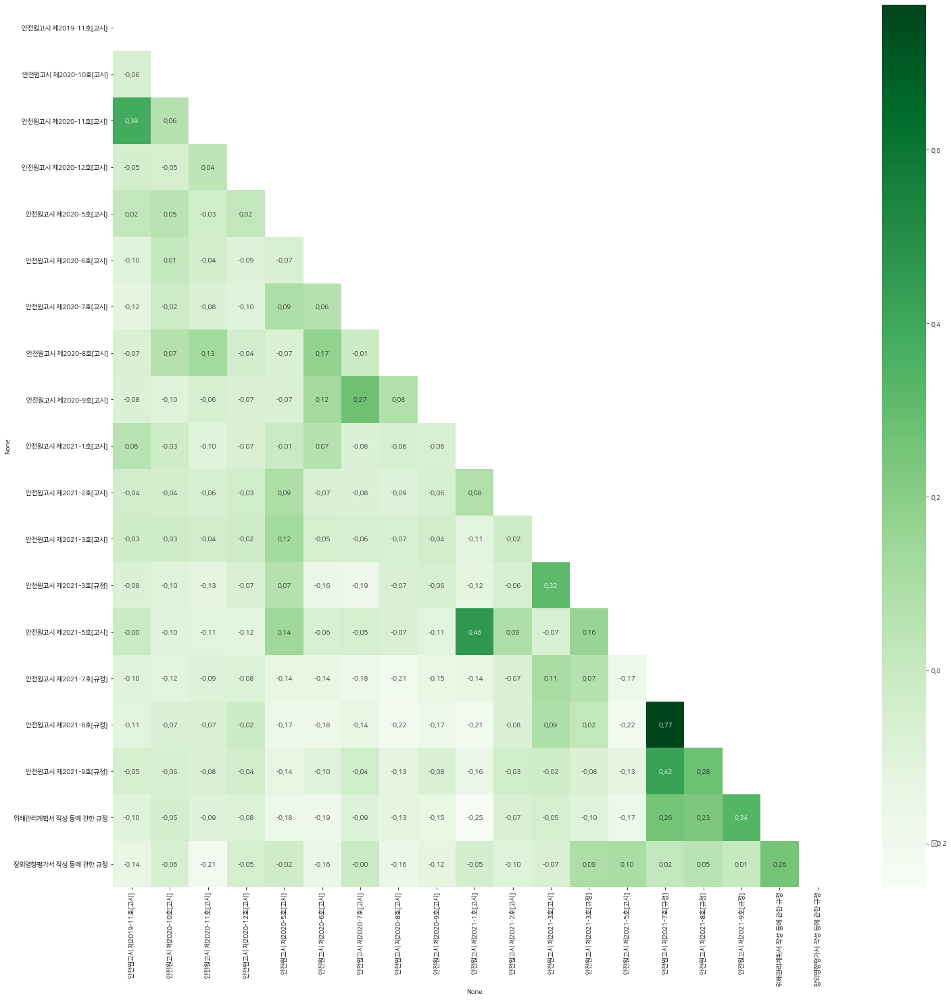

In [200]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.font_manager as fm #한글 설정



font_location = 'C:/WINDOWS/Fonts/NanumSquare.ttf'
font_name = fm.FontProperties(fname=font_location).get_name()
plt.rc('font', family=font_name)

mask = np.triu(np.ones_like(correlation, dtype=np.bool))

plt.figure(figsize=(24,24),facecolor='white')
sns.heatmap(correlation, annot = True, #실제 값 화면에 나타내기
            fmt=".2f",
            cmap = 'Greens', #색상
            mask=mask
          )

## --- 고시별 날짜

In [214]:
gosi_lists

array(['안전원고시 제2019-11호[고시]', '안전원고시 제2020-7호[고시]', '안전원고시 제2020-12호[고시]',
       '', '안전원고시 제2020-8호[고시], 안전원고시 제2020-5호[고시]', '안전원고시 제2020-5호[고시]',
       '안전원고시 제2020-8호[고시]',
       '안전원고시 제2020-5호[고시], 안전원고시 제2021-7호[규정], 안전원고시 제2021-8호[규정]',
       '안전원고시 제2020-7호[고시], 안전원고시 제2020-5호[고시]', '안전원고시 제2020-11호[고시]',
       '안전원고시 제2021-7호[규정]',
       '안전원고시 제2020-6호[고시], 안전원고시 제2020-8호[고시], 안전원고시 제2021-1호[고시]',
       '안전원고시 제2021-1호[고시]',
       '안전원고시 제2020-5호[고시], 안전원고시 제2021-5호[고시], 안전원고시 제2021-1호[고시]',
       '안전원고시 제2020-6호[고시], 안전원고시 제2020-8호[고시], 안전원고시 제2020-10호[고시], 안전원고시 제2020-11호[고시]',
       '안전원고시 제2020-5호[고시], 안전원고시 제2019-11호[고시]',
       '안전원고시 제2021-7호[규정], 안전원고시 제2021-3호[규정], 안전원고시 제2021-8호[규정]',
       '안전원고시 제2021-7호[규정], 안전원고시 제2021-8호[규정], 장외영향평가서 작성 등에 관한 규정, 위해관리계획서 작성 등에 관한 규정',
       '안전원고시 제2020-5호[고시], 안전원고시 제2021-1호[고시]',
       '안전원고시 제2020-7호[고시], 안전원고시 제2020-5호[고시], 안전원고시 제2020-10호[고시], 안전원고시 제2020-11호[고시], 안전원고시 제2021-8호[규정]',
       '안전원고시 제2020-8호[

In [219]:
gosi_df2= pd.DataFrame(file["Column1.create_date"])

for gosi in gosi_list:
    
    temp_df = pd.DataFrame(columns=[gosi])
    
    for l_gosi in file['gosi']:
        flag = 0
        if gosi in l_gosi :
            flag = 1
            
        temp_df = pd.concat([temp_df,pd.DataFrame({gosi:[flag]})], ignore_index=True)


    
    gosi_df2.loc[:,gosi] = temp_df
    
gosi_df2

,Column1.create_date,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
0,2022-03-07,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2022-03-10,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2022-03-12,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,2022-03-11,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2022-03-11,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4280,2021-12-15,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4281,2021-12-10,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4282,2021-12-16,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4283,2021-11-25,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [220]:
# 고시 추출된 횟수

temp_df1 = gosi_df2.copy()
temp_df1 = temp_df1.drop('Column1.create_date', axis=1)
temp_df1["RowSum"] = temp_df1.sum(axis=1) 
#temp_df1['RowSum'].sum()
temp_df1[temp_df1['RowSum']!=0].count()
#3446

안전원고시 제2020-7호[고시]     2311
안전원고시 제2020-6호[고시]     2311
안전원고시 제2020-9호[고시]     2311
안전원고시 제2020-8호[고시]     2311
안전원고시 제2020-5호[고시]     2311
안전원고시 제2020-10호[고시]    2311
안전원고시 제2019-11호[고시]    2311
안전원고시 제2020-11호[고시]    2311
안전원고시 제2020-12호[고시]    2311
안전원고시 제2021-2호[고시]     2311
안전원고시 제2021-3호[고시]     2311
안전원고시 제2022-2호[고시]     2311
안전원고시 제2021-5호[고시]     2311
안전원고시 제2021-1호[고시]     2311
안전원고시 제2021-7호[규정]     2311
안전원고시 제2021-2호[규정]     2311
안전원고시 제2021-3호[규정]     2311
안전원고시 제2021-8호[규정]     2311
안전원고시 제2021-9호[규정]     2311
장외영향평가서 작성 등에 관한 규정    2311
위해관리계획서 작성 등에 관한 규정    2311
RowSum                 2311
dtype: int64

In [221]:
# 고시별 게시물 수

temp_df2 = gosi_df2.copy()
temp_df2 = temp_df2.drop('Column1.create_date', axis=1)
temp_df2.sum()



안전원고시 제2020-7호[고시]     157
안전원고시 제2020-6호[고시]     258
안전원고시 제2020-9호[고시]      34
안전원고시 제2020-8호[고시]     341
안전원고시 제2020-5호[고시]     850
안전원고시 제2020-10호[고시]     34
안전원고시 제2019-11호[고시]     20
안전원고시 제2020-11호[고시]     83
안전원고시 제2020-12호[고시]     31
안전원고시 제2021-2호[고시]      13
안전원고시 제2021-3호[고시]       2
안전원고시 제2022-2호[고시]       0
안전원고시 제2021-5호[고시]     379
안전원고시 제2021-1호[고시]     988
안전원고시 제2021-7호[규정]      99
안전원고시 제2021-2호[규정]       0
안전원고시 제2021-3호[규정]      38
안전원고시 제2021-8호[규정]     101
안전원고시 제2021-9호[규정]       9
장외영향평가서 작성 등에 관한 규정    209
위해관리계획서 작성 등에 관한 규정    132
dtype: object

In [222]:
# 같은 날짜 합구하기
all_gosi=gosi_df2.groupby('Column1.create_date').sum()   
all_gosi["RowSum"] = all_gosi.sum(axis=1) # 결측 날짜 제거를 위해 합 구하기
all_gosi
#print(all_gosi.index)

,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],안전원고시 제2021-2호[고시],...,안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정,RowSum
Column1.create_date,,,,,,,,,,,,,,,,,,,,,
2017-04-05,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2017-04-06,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,2
2017-04-07,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,2
2017-04-10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
2017-04-11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-09,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2022-05-10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2022-05-11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [223]:
all_gosi = all_gosi[all_gosi['RowSum']!=0] # 0이 아닌 행만 가져오기
del all_gosi['RowSum'] # RowSum 다시 삭제
all_gosi

,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],안전원고시 제2021-2호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
Column1.create_date,,,,,,,,,,,,,,,,,,,,,
2017-04-06,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2017-04-07,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
2017-04-10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2017-04-17,1,0,0,0,1,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0
2017-04-18,1,0,0,0,1,1,0,0,0,0,...,0,0,1,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-04,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2022-05-06,0,0,0,0,1,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
2022-05-07,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [224]:
month_gosi = all_gosi.resample(rule='M').sum()
print(month_gosi.index)

DatetimeIndex(['2017-04-30', '2017-05-31', '2017-06-30', '2017-07-31',
               '2017-08-31', '2017-09-30', '2017-10-31', '2017-11-30',
               '2017-12-31', '2018-01-31', '2018-02-28', '2018-03-31',
               '2018-04-30', '2018-05-31', '2018-06-30', '2018-07-31',
               '2018-08-31', '2018-09-30', '2018-10-31', '2018-11-30',
               '2018-12-31', '2019-01-31', '2019-02-28', '2019-03-31',
               '2019-04-30', '2019-05-31', '2019-06-30', '2019-07-31',
               '2019-08-31', '2019-09-30', '2019-10-31', '2019-11-30',
               '2019-12-31', '2020-01-31', '2020-02-29', '2020-03-31',
               '2020-04-30', '2020-05-31', '2020-06-30', '2020-07-31',
               '2020-08-31', '2020-09-30', '2020-10-31', '2020-11-30',
               '2020-12-31', '2021-01-31', '2021-02-28', '2021-03-31',
               '2021-04-30', '2021-05-31', '2021-06-30', '2021-07-31',
               '2021-08-31', '2021-09-30', '2021-10-31', '2021-11-30',
      

In [225]:
#날짜 별 간격 안 띄우게

try :
    month_gosi.index=month_gosi.index.strftime('%m/%d/%Y')

except:
    ;
    

#all_gosi.columns

In [226]:
month_gosi.to_excel('./월별 고시 당 질의 수.xlsx')
month_gosi

,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],안전원고시 제2021-2호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
Column1.create_date,,,,,,,,,,,,,,,,,,,,,
04/30/2017,2,1,1,0,5,1,0,1,0,0,...,0,0,11,0,0,0,0,0,1,1
05/31/2017,0,2,0,0,3,1,0,0,0,0,...,0,0,8,0,0,0,0,0,0,0
06/30/2017,1,0,0,0,7,0,0,0,0,0,...,0,0,9,0,0,0,0,0,1,0
07/31/2017,2,3,2,2,12,0,0,0,0,0,...,0,0,9,0,0,0,0,0,1,0
08/31/2017,2,1,0,2,11,0,0,0,0,0,...,0,1,10,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
01/31/2022,1,3,0,5,20,2,2,3,0,2,...,0,2,9,2,0,1,4,0,2,2
02/28/2022,6,3,2,7,19,1,0,1,0,1,...,0,9,11,4,0,2,4,0,3,0
03/31/2022,4,1,1,8,12,3,1,0,2,0,...,0,3,6,7,0,0,5,0,1,0


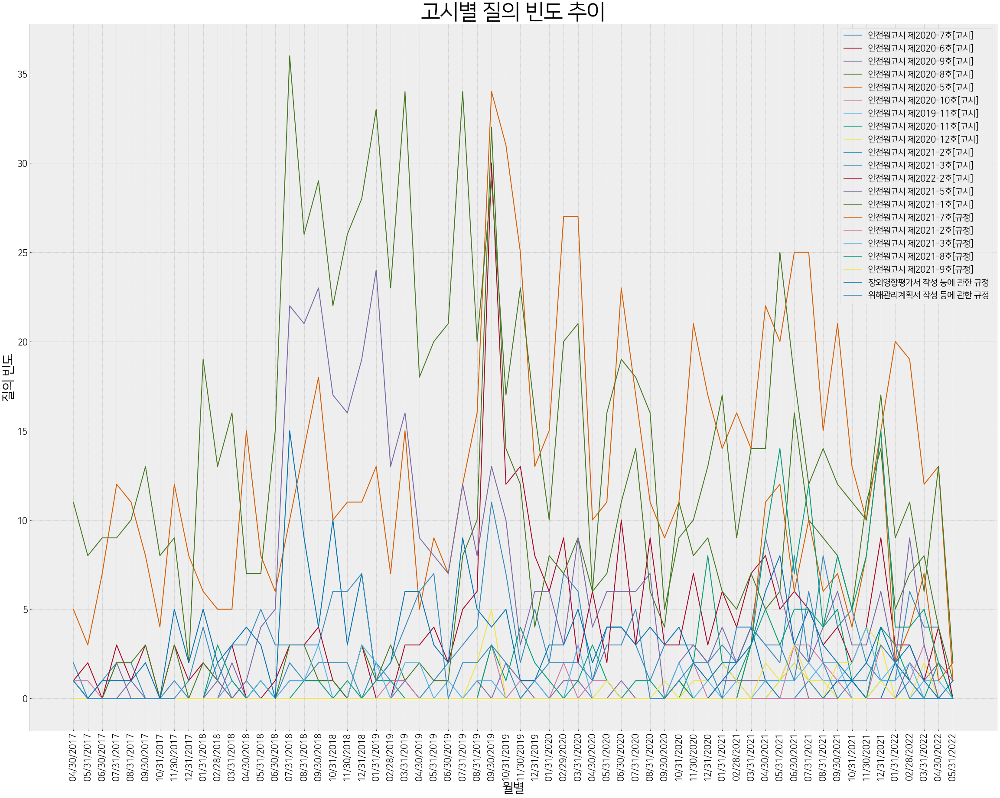

In [228]:
# 시각화 하기

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm #한글 설정
#InteractiveShell.ast_node_interactivity = 'last_expr'

font_location = 'C:/WINDOWS/Fonts/NanumSquare.ttf'
font_name = fm.FontProperties(fname=font_location).get_name()
plt.rc('font', family=font_name)

plt.rc('legend',fontsize=20)
#plt.rc('axes', labelsize=20)   # x,y축 label 폰트 크기
plt.rcParams['axes.unicode_minus'] = False    


gosi_name = month_gosi.columns
gosi_name

plt.style.use('bmh')

plt.figure(figsize=(40,30),facecolor='white')
for gosi in gosi_name:
    
    plt.plot(month_gosi.index, month_gosi[gosi], label=gosi)
    # 범례 표시
    plt.legend()
    # 제목
    plt.title('고시별 질의 빈도 추이', fontsize=50)
    # x축 이름
    plt.xlabel('월별', fontsize=30)
    # y축 이름
    plt.ylabel('질의 빈도', fontsize=30)
    # x축 설정(rotation은 각도)
    plt.xticks(month_gosi.index, rotation=90,fontsize=20)
    
    plt.yticks(fontsize=20)



C:\Users\joon\AppData\Local\Temp/ipykernel_1796/2584387142.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(40,30),facecolor='white')


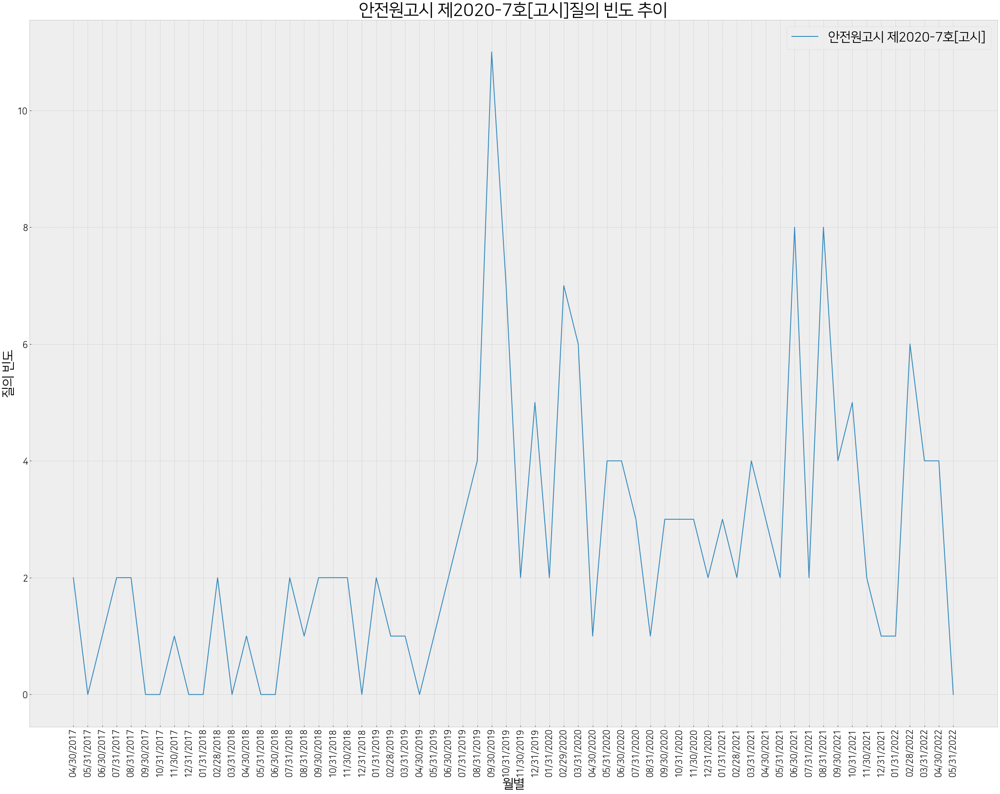

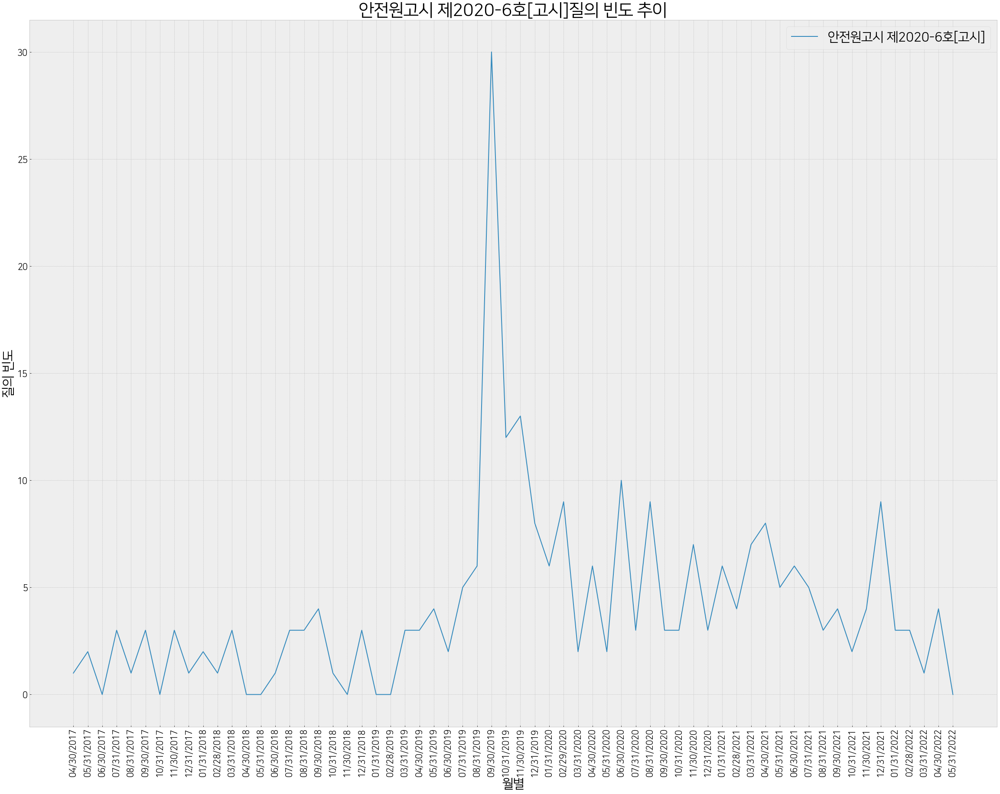

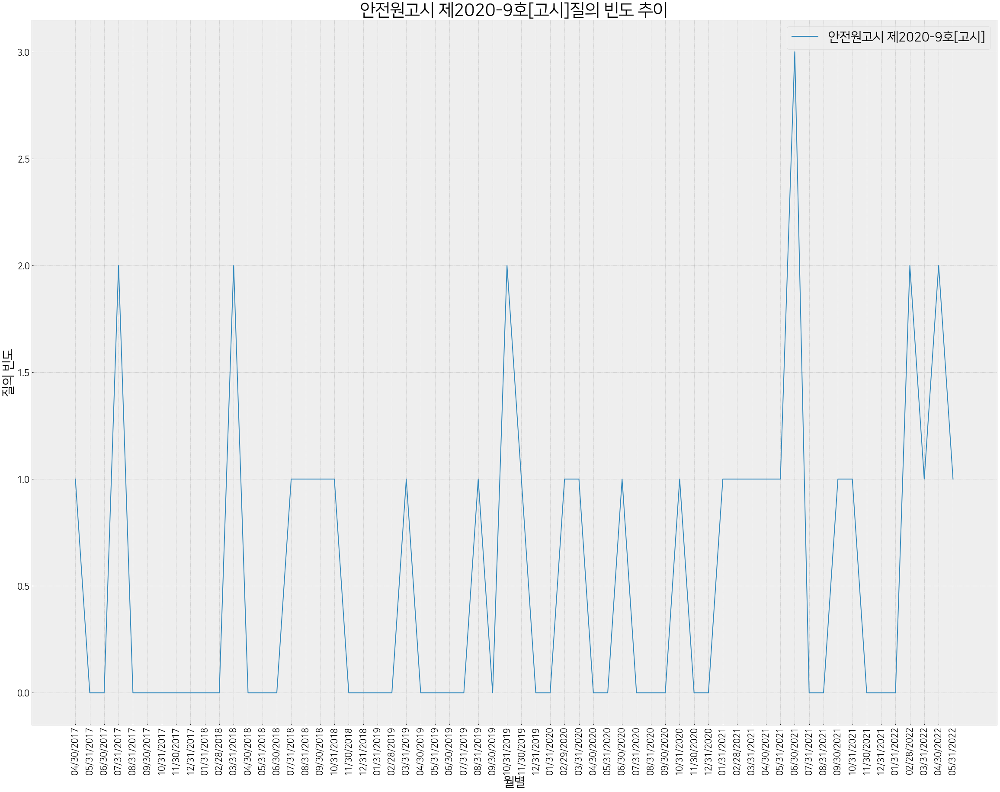

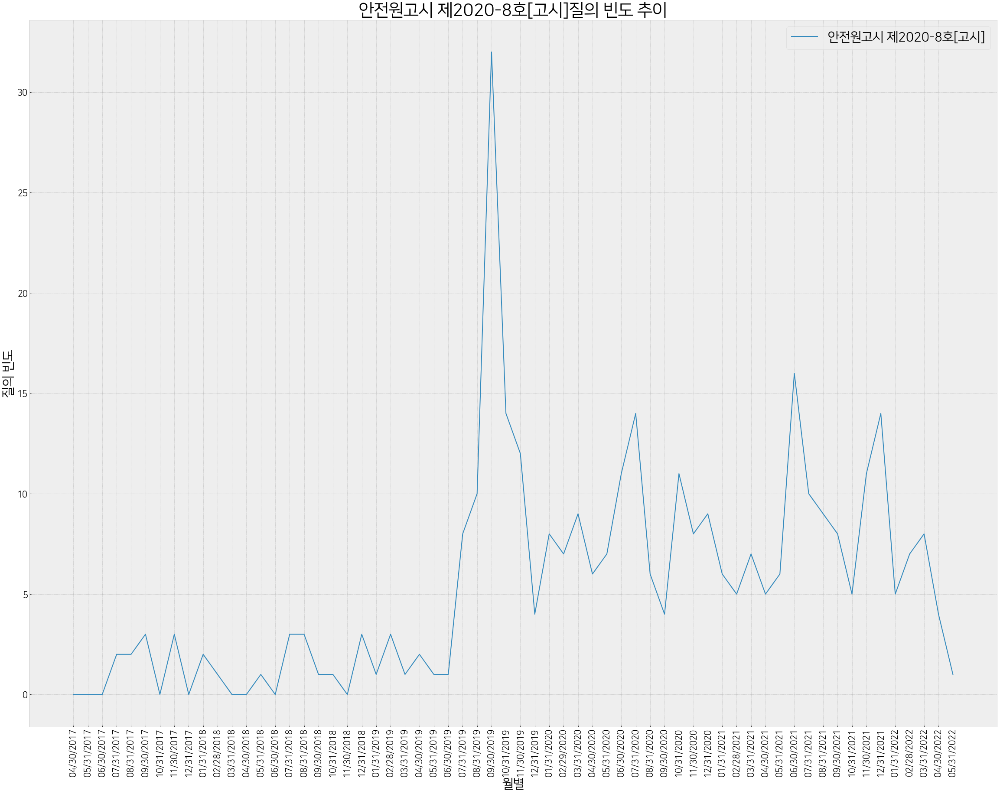

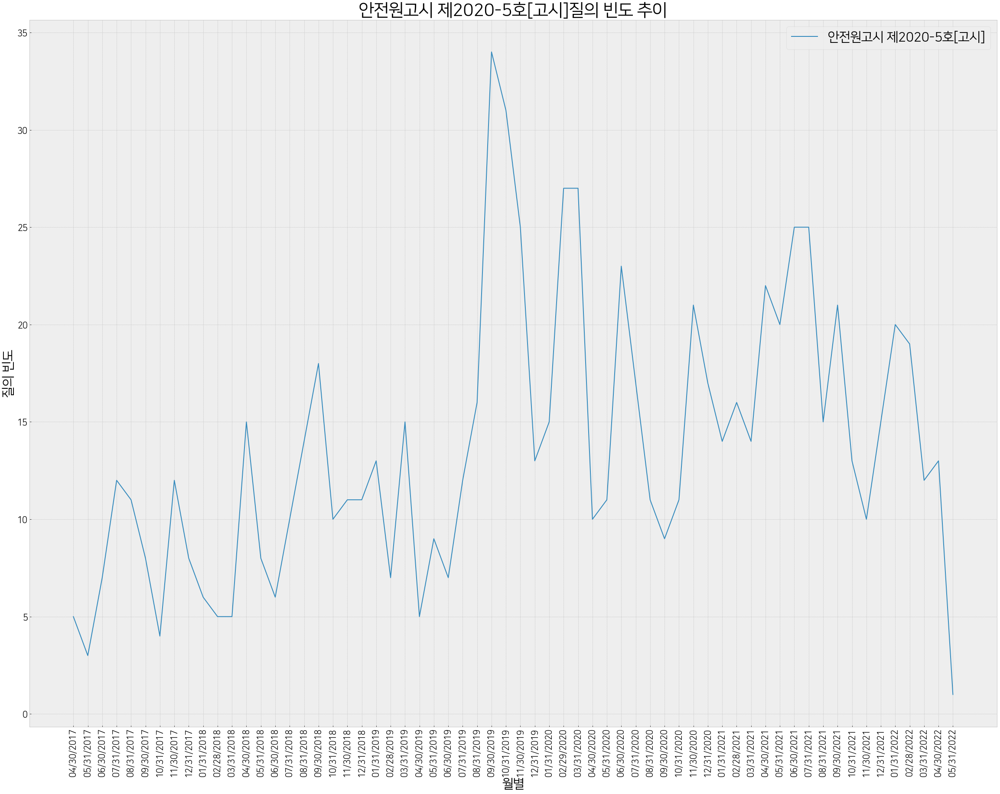

...

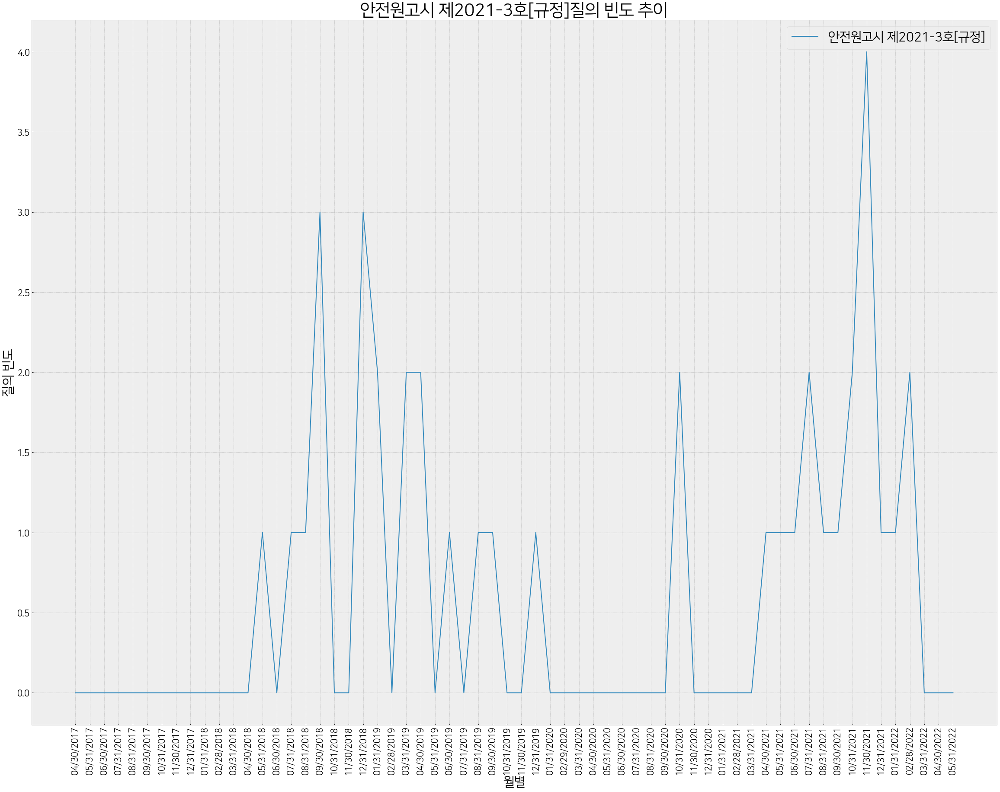

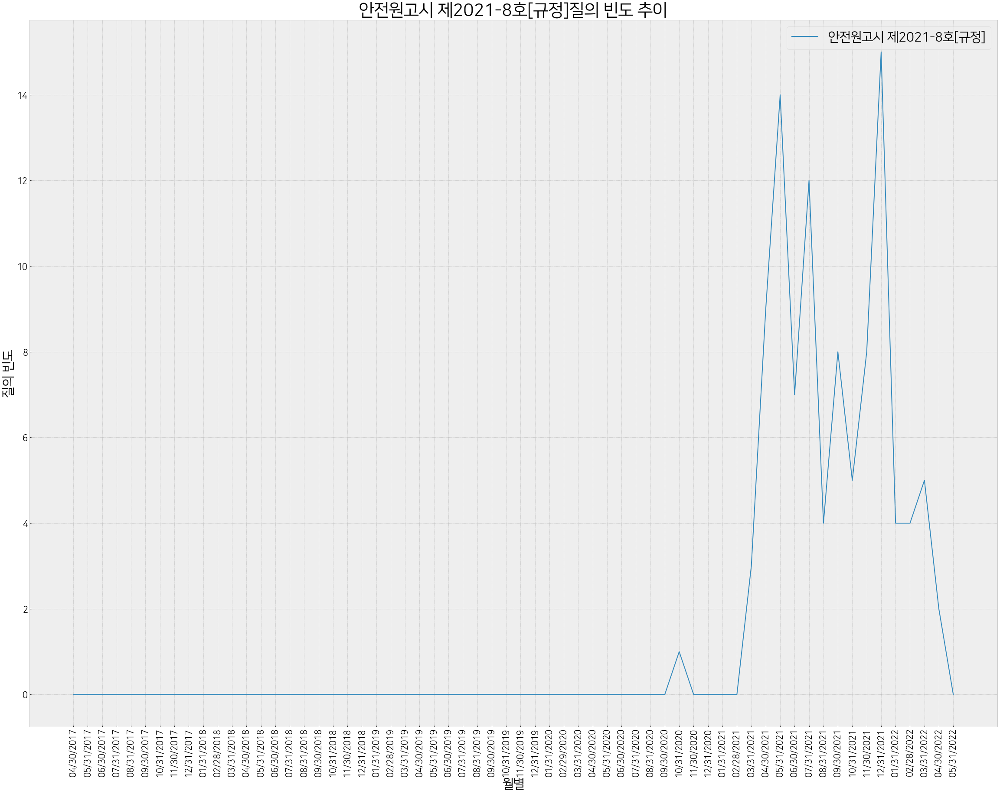

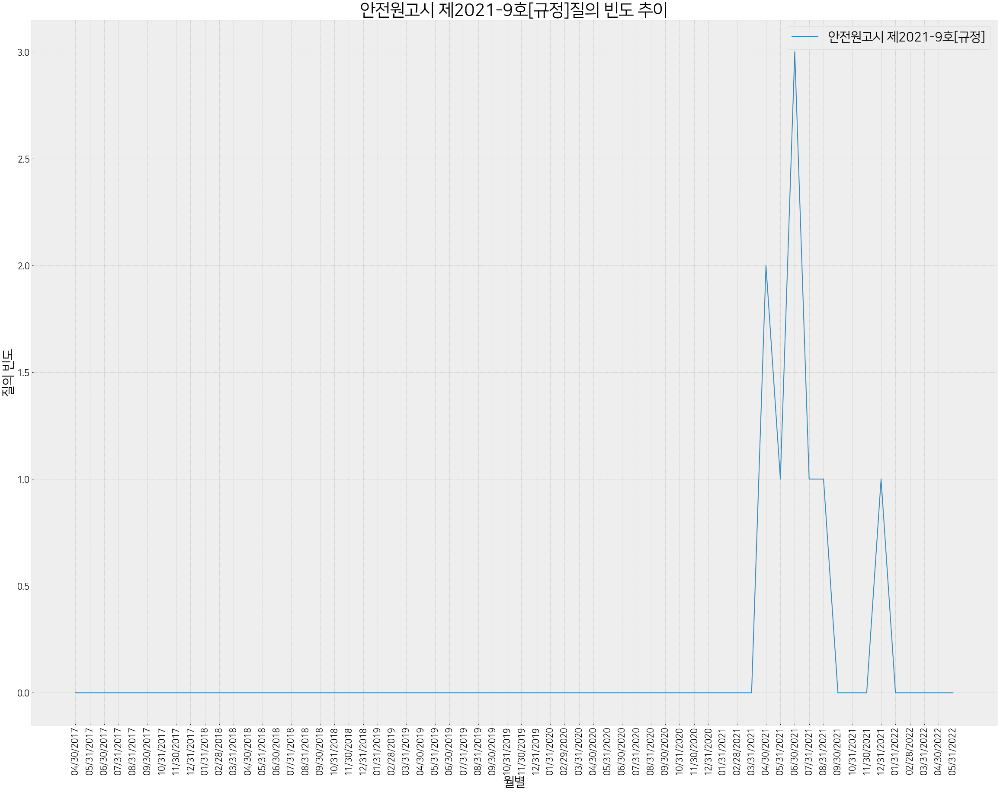

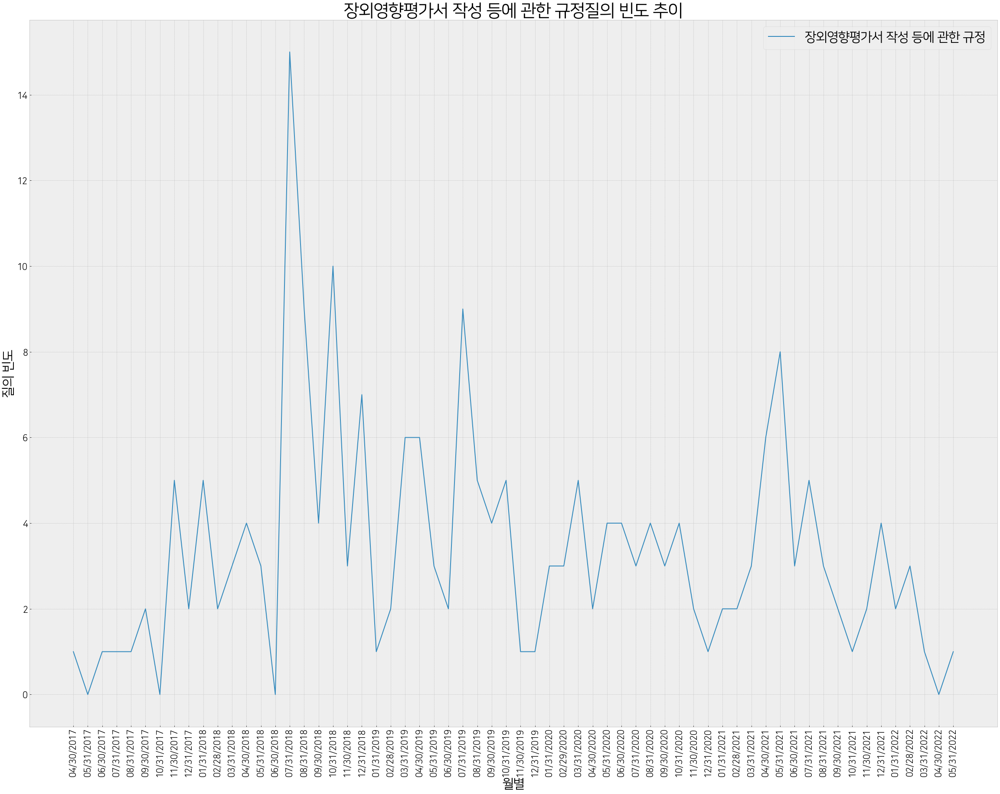

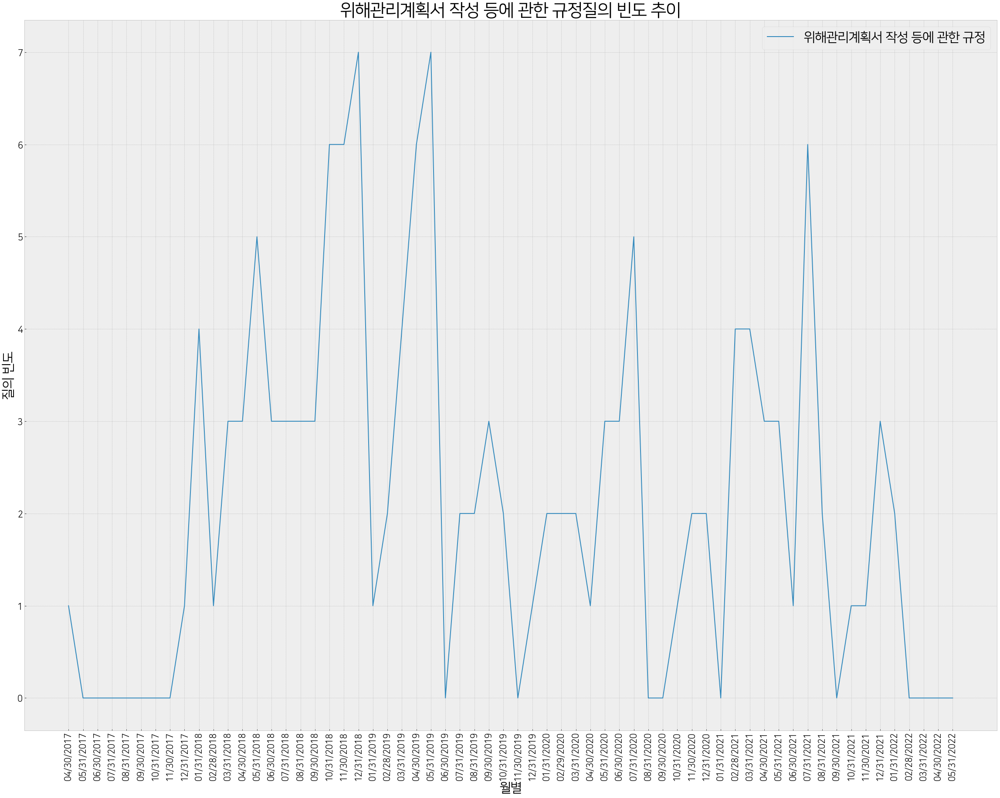

In [229]:
# 시각화 하기

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm #한글 설정
#한 번에 출력 여러 번 시키기위한 라이브러리 
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" 



font_location = 'C:/WINDOWS/Fonts/NanumSquare.ttf'
font_name = fm.FontProperties(fname=font_location).get_name()

for gosi in gosi_name:
    plt.rc('font', family=font_name)
    plt.rc('legend',fontsize=30)
    #plt.rc('axes', labelsize=20)   # x,y축 label 폰트 크기
    plt.rcParams['axes.unicode_minus'] = False    


    gosi_name = month_gosi.columns
    gosi_name

    plt.style.use('bmh')

    plt.figure(figsize=(40,30),facecolor='white')

    plt.plot(month_gosi.index, month_gosi[gosi], label=gosi)
        # 범례 표시
    plt.legend()
        # 제목
    plt.title(gosi+'질의 빈도 추이', fontsize=40)
        # x축 이름
    plt.xlabel('월별', fontsize=30)
        # y축 이름
    plt.ylabel('질의 빈도', fontsize=30)
        # x축 설정(rotation은 각도)
    plt.xticks(month_gosi.index, rotation=90,fontsize=20)

    plt.yticks(fontsize=20)

    plt.savefig('./result3/_월별 고시 질의 빈도/개별/'+gosi+'.png', dpi=300)

### --- 고시별 담당자

In [ ]:
gosi_list

In [230]:
#담당자
gosi_df3= pd.DataFrame(file["manager"])

for gosi in gosi_list:
    
    temp_df = pd.DataFrame(columns=[gosi])

    for k_gosi in file['gosi']:
        flag = 0
        if gosi in k_gosi :
            flag = 1


        temp_df = pd.concat([temp_df,pd.DataFrame({gosi:[flag]})], ignore_index=True)



    gosi_df3.loc[:,gosi] = temp_df
    
gosi_df3

,manager,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
0,이선민,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,정인희,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,이선민,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,정인희,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,이선민,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4280,신은수,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4281,곽솔림,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4282,정재형,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4283,,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [231]:
gosi_df3[~gosi_df3['manager'].str.contains(', ')]

,manager,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
0,이선민,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,정인희,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,이선민,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,정인희,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,이선민,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4280,신은수,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4281,곽솔림,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4282,정재형,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4283,,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [232]:
all_manager_gosi = pd.DataFrame()
all_manager_gosi

temp1 = gosi_df3[gosi_df3['manager'].str.contains(', ')].copy()

for i in range(len(temp1)):
    managers_gosi = temp1.iloc[i]
    managers_temp = managers_gosi.copy()

    for j in managers_gosi['manager'] .split(', ') :    
        managers_temp['manager'] = j
        all_manager_gosi = pd.concat([all_manager_gosi,managers_temp], axis = 1)

all_manager_gosi.transpose()

""


,manager,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
82,장유진,0,0,0,0,1,0,0,0,0,...,0,0,1,1,0,0,1,0,0,0
82,곽솔림,0,0,0,0,1,0,0,0,0,...,0,0,1,1,0,0,1,0,0,0
592,신은수,0,0,0,0,1,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
592,김남석,0,0,0,0,1,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
846,이은별,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
846,김종구,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1411,이은별,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1411,최민영,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1427,이연희,0,0,0,0,1,0,0,0,0,...,0,1,1,0,0,0,0,0,1,0
1427,최민영,0,0,0,0,1,0,0,0,0,...,0,1,1,0,0,0,0,0,1,0


In [233]:
all_manager_gosi = pd.concat([gosi_df3[~gosi_df3['manager'].str.contains(', ')],all_manager_gosi.transpose()])

In [234]:
# 같은 담당자 합구하기
all_manager_gosi2=all_manager_gosi.groupby('manager').sum()
all_manager_gosi2.rename(index={'':'기타(추출 안된 담당자)'},inplace=True)
#all_manager_gosi["RowSum"] = all_manager_gosi.sum(axis=1) # 결측 날짜 제거를 위해 합 구하기
all_manager_gosi2.to_csv('./담당자 별 고시.csv', encoding = "utf-8-sig")

all_manager_gosi2


,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],안전원고시 제2021-2호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
manager,,,,,,,,,,,,,,,,,,,,,
기타(추출 안된 담당자),12,13,3,20,27,1,1,5,0,0,...,0,20,60,19,0,1,10,3,24,17
곽솔림,18,17,2,30,61,5,2,11,4,3,...,0,14,56,2,0,1,4,1,3,0
김남석,10,5,3,5,35,1,0,0,0,0,...,0,30,59,0,0,1,0,0,11,2
김민수,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,5,20
김승하,0,0,0,0,0,0,0,0,0,0,...,0,0,1,3,0,0,4,2,1,2
김원종,0,1,0,5,5,0,0,1,0,0,...,0,2,5,2,0,0,2,0,1,1
김인자,0,0,0,0,3,0,0,0,0,0,...,0,0,0,24,0,7,25,0,8,5
김종구,19,47,1,43,98,1,1,5,3,0,...,0,38,97,0,0,3,0,0,21,3
박중돈,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,16


In [241]:
#for i in range(1):

for i in range(len(all_manager_gosi2)):
    plt.clf()
    temp = all_manager_gosi2.transpose().iloc[i]

    for j in temp.index :
        if(temp[j]==0) :
            del temp[j]
    
    
    
    plt.figure(figsize=(5,5),facecolor='white') ## 캔버스 생성
    plt.title(temp.name, fontsize=15)
    plt.rc('legend',fontsize=5)
    plt.pie(temp,labels=temp.index, autopct='%d%%')
    
    #plt.show()
    plt.savefig('./result3/고시별 담당자 빈도/개별/'+temp.name+'.png', dpi=300)


<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-7호[고시]')

([<matplotlib.patches.Wedge at 0x28ca64d4880>,
 [Text(1.0688362770485593, 0.25997887003557735, '기타(추출 안된 담당자)'),
  Text(0.7382082946324415, 0.8155050666524781, '곽솔림'),
  Text(0.19579772020284048, 1.0824339484529162, '김남석'),
  Text(-0.42599827258428685, 1.014162448405187, '김종구'),
  Text(-0.9562522964066956, 0.5436741171114562, '신은수'),
  Text(-1.0737939431516166, 0.23867670110612582, '이경희'),
  Text(-1.0991303366503948, 0.04373217413746548, '이선민'),
  Text(-1.089362413478655, -0.1526090826260346, '이세용'),
  Text(-0.9964244347233625, -0.4659810574328401, '이연희'),
  Text(0.06557664736555509, -1.0980435798820982, '이은별'),
  Text(1.0054922015098466, -0.4460778325616309, '임형준'),
  Text(1.0783271074845409, -0.21728011704715106, '정인희'),
  Text(1.094568367378093, -0.10917916071877516, '정재형'),
  Text(1.0997825630560834, -0.021870390892533613, '최민영')],
 [Text(0.5830016056628504, 0.14180665638304218, '7%'),
  Text(0.4026590697995135, 0.4448209454468062, '11%'),
  Text(0.10679875647427661, 0.590418517337

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-6호[고시]')

([<matplotlib.patches.Wedge at 0x28ca6552d90>,
 [Text(1.0863526128045824, 0.17273679588511948, '기타(추출 안된 담당자)'),
  Text(0.9537378878169293, 0.5480730255563603, '곽솔림'),
  Text(0.775455214055832, 0.7801725520637238, '김남석'),
  Text(0.7166730079182968, 0.834493738575276, '김원종'),
  Text(0.13971962583676614, 1.0910904756966924, '김종구'),
  Text(-0.7563023372066281, 0.7987532627387458, '신은수'),
  Text(-0.9730459582162307, 0.5130122446872566, '윤진선'),
  Text(-0.9852037941652457, 0.4892580954490219, '이경희'),
  Text(-1.007773305856782, 0.440900174645569, '이선민'),
  Text(-1.049810539115089, 0.32847805400496155, '이세용'),
  Text(-1.0970881232299659, -0.0799853103247812, '이연희'),
  Text(-0.1397196354138217, -1.091090474470302, '이은별'),
  Text(0.9537378870151434, -0.5480730269516005, '임형준'),
  Text(1.0326440262352763, -0.3790070119148171, '전다영'),
  Text(1.0818428775580786, -0.19903765542443574, '정인희'),
  Text(1.098705512900009, -0.05334975091908381, '정재형'),
  Text(1.0999190796458052, -0.013342347286931754, '최

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-9호[고시]')

([<matplotlib.patches.Wedge at 0x28ca65eef70>,
 [Text(1.0603591446126612, 0.292640537923756, '기타(추출 안된 담당자)'),
  Text(0.8283786012298484, 0.7237326115524156, '곽솔림'),
  Text(0.43232751046746465, 1.0114805602150763, '김남석'),
  Text(0.049351278294183905, 1.0988923747714014, '김종구'),
  Text(-0.244773063211686, 1.0724206952152537, '신은수'),
  Text(-0.521255562567861, 0.9686550668282611, '이경희'),
  Text(-0.8283786435803079, 0.7237325630784133, '이선민'),
  Text(-1.0823225587548815, 0.19641252203025653, '이연희'),
  Text(-0.43232743944123, -1.0114805905731408, '이은별'),
  Text(0.8899187785623721, -0.6465636608734332, '임형준'),
  Text(1.0603591874235632, -0.2926403828018971, '정재형'),
  Text(1.095571737193148, -0.09860308648104259, '최민영')],
 [Text(0.5783777152432698, 0.15962211159477596, '8%'),
  Text(0.4518428733980991, 0.39476324266495394, '5%'),
  Text(0.23581500570952615, 0.5517166692082233, '8%'),
  Text(0.026918879069554855, 0.5993958407844007, '2%'),
  Text(-0.13351257993364687, 0.5849567428446838, '5%'

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-8호[고시]')

([<matplotlib.patches.Wedge at 0x28ca666bc70>,
 [Text(1.0813797890669945, 0.2015384623277224, '기타(추출 안된 담당자)'),
  Text(0.8790747395098407, 0.6612318824404235, '곽솔림'),
  Text(0.6242295176295382, 0.9057248529879228, '김남석'),
  Text(0.5382568800860583, 0.9593120092232885, '김원종'),
  Text(0.07594582591223567, 1.0973751553258844, '김종구'),
  Text(-0.8212907671251485, 0.7317659980041334, '신은수'),
  Text(-1.0774829412503095, 0.22142834352128962, '윤진선'),
  Text(-1.0831906259380677, 0.19156739774788784, '이경희'),
  Text(-1.0988331463426992, 0.05065290217356253, '이선민'),
  Text(-1.0953350529172012, -0.1011984281047498, '이세용'),
  Text(-1.026149532911513, -0.39625387834756126, '이연희'),
  Text(-0.06583272954689708, -1.0980282563397015, '이은별'),
  Text(0.9198607483375887, -0.6032049433383413, '임형준'),
  Text(1.029756585775485, -0.38678336837565386, '전다영'),
  Text(1.0794771752695045, -0.21149238301218187, '정인희'),
  Text(1.0988331453052842, -0.05065292467860282, '정재형')],
 [Text(0.5898435213092696, 0.109930070360

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-5호[고시]')

([<matplotlib.patches.Wedge at 0x28ca672e2b0>,
 [Text(1.094616388550663, 0.10869665089736734, '기타(추출 안된 담당자)'),
  Text(1.0036936200328004, 0.450110116644197, '곽솔림'),
  Text(0.7870288327165251, 0.7684956840951445, '김남석'),
  Text(0.6663002791521837, 0.8752393604047536, '김원종'),
  Text(0.6403498206931507, 0.8944004176755789, '김인자'),
  Text(0.2733245119181758, 1.0655016242055622, '김종구'),
  Text(-0.12273159921654034, 1.0931317187575114, '박중돈'),
  Text(-0.5277368392693412, 0.9651392793156881, '신은수'),
  Text(-0.8540563818072402, 0.6932443268389045, '윤진선'),
  Text(-0.8641293906853762, 0.6806470422720727, '이경희'),
  Text(-0.9183795009506096, 0.6054577542931542, '이선민'),
  Text(-0.964170361895428, 0.5295049699884218, '이세용'),
  Text(-1.068920662564667, 0.2596316951805255, '이연희'),
  Text(-1.0997339360657317, -0.024192351381646195, '이은미'),
  Text(-0.34681430080934306, -1.0438964703236269, '이은별'),
  Text(0.9420407021423787, -0.5679430565708983, '임형준'),
  Text(1.0085828595471527, -0.4390451177586292, '장

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-10호[고시]')

([<matplotlib.patches.Wedge at 0x28ca79e3730>,
 [Text(1.0953075938896017, 0.10149519578665463, '기타(추출 안된 담당자)'),
  Text(0.877818936773815, 0.6628981175424239, '곽솔림'),
  Text(0.3973657922029253, 1.0257194680744546, '김남석'),
  Text(0.20212442605192765, 1.0812704177925054, '김종구'),
  Text(-0.39736589423988505, 1.0257194285451245, '신은수'),
  Text(-0.9352388955464417, 0.5790753044786768, '이선민'),
  Text(-1.081270426071866, 0.2021243817612461, '이연희'),
  Text(-0.662897994261407, -0.8778190298713076, '이은별'),
  Text(0.5790755343325441, -0.9352387532269387, '임형준'),
  Text(0.877819064782863, -0.6628979480310222, '전다영'),
  Text(0.9846797057210753, -0.49031202018822323, '정인희'),
  Text(1.0812704449961115, -0.20212428052540235, '정재형')],
 [Text(0.5974405057579646, 0.05536101588362979, '2%'),
  Text(0.47881032914935356, 0.3615807913867766, '14%'),
  Text(0.21674497756523195, 0.5594833462224297, '2%'),
  Text(0.11024968693741508, 0.5897838642504574, '2%'),
  Text(-0.21674503322175545, 0.5594833246609769, '1

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2019-11호[고시]')

([<matplotlib.patches.Wedge at 0x28ca7a6f880>,
 [Text(1.0864571742518743, 0.1720779140872905, '기타(추출 안된 담당자)'),
  Text(0.8899186877588753, 0.6465637858537406, '곽솔림'),
  Text(0.4993895336547566, 0.9801071847895438, '김종구'),
  Text(-0.7778174593052023, 0.7778174593052024, '신은수'),
  Text(-0.980107184789544, -0.4993895336547564, '이선민'),
  Text(-0.646563785853741, -0.889918687758875, '이연희'),
  Text(0.17207792680247347, -1.086457172237987, '이은별'),
  Text(0.8899187180267094, -0.6465637441936395, '임형준'),
  Text(1.0864571823074214, -0.17207786322655924, '정재형')],
 [Text(0.5926130041373858, 0.09386068041124936, '5%'),
  Text(0.4854101933230228, 0.35267115592022213, '10%'),
  Text(0.27239429108441265, 0.5346039189761147, '5%'),
  Text(-0.42426406871192845, 0.4242640687119285, '34%'),
  Text(-0.5346039189761148, -0.27239429108441254, '5%'),
  Text(-0.3526711559202223, -0.48541019332302265, '10%'),
  Text(0.0938606873468037, -0.5926130030389019, '15%'),
  Text(0.4854102098327505, -0.3526711331965306,

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-11호[고시]')

([<matplotlib.patches.Wedge at 0x28ca7ae0df0>,
 [Text(1.0803596307117151, 0.20693735363255852, '기타(추출 안된 담당자)'),
  Text(0.770422534852063, 0.7851427372090517, '곽솔림'),
  Text(0.3478284088659529, 1.0435590055122805, '김원종'),
  Text(0.10393361558439618, 1.095078902888534, '김종구'),
  Text(-0.7088367411022181, 0.841160195482161, '신은수'),
  Text(-1.0874166412034916, 0.16590674619712414, '이선민'),
  Text(-0.9694993943062634, -0.5196834848634202, '이연희'),
  Text(0.14529856214214834, -1.090361558309639, '이은별'),
  Text(0.9491393662832274, -0.5559986181380973, '임형준'),
  Text(1.0717550049335554, -0.24767157568012252, '정인희'),
  Text(1.0968496461477426, -0.08319166872693307, '정재형')],
 [Text(0.5892870712972992, 0.11287492016321372, '6%'),
  Text(0.42023047355567067, 0.4282596748413009, '13%'),
  Text(0.1897245866541561, 0.5692140030066983, '1%'),
  Text(0.056691063046034273, 0.5973157652119275, '6%'),
  Text(-0.3866382224193916, 0.45881465208117866, '19%'),
  Text(-0.593136349747359, 0.09049458883479497, '

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-12호[고시]')

([<matplotlib.patches.Wedge at 0x28ca7b5c3d0>,
 [Text(1.0108535980228326, 0.4337914284126577, '곽솔림'),
  Text(0.4844335995233389, 0.9875849774337707, '김종구'),
  Text(-0.8346338830256941, 0.7165097914930766, '신은수'),
  Text(-1.0108536386373128, -0.43379133376971146, '이선민'),
  Text(-0.7578637048927315, -0.7972719766844077, '이연희'),
  Text(-0.055714238349465386, -1.098588150147788, '이은별'),
  Text(0.5818602647508669, -0.9335087746261688, '임형준'),
  Text(0.8346338159412022, -0.7165098696371375, '전다영'),
  Text(1.049553123361229, -0.32929962229357196, '정재형')],
 [Text(0.5513746898306359, 0.23661350640690418, '12%'),
  Text(0.2642365088309121, 0.5386827149638749, '9%'),
  Text(-0.45525484528674215, 0.3908235226325872, '32%'),
  Text(-0.5513747119839887, -0.23661345478347895, '3%'),
  Text(-0.4133802026687626, -0.43487562364604054, '9%'),
  Text(-0.030389584554253845, -0.5992299000806116, '12%'),
  Text(0.31737832622774553, -0.5091866043415466, '6%'),
  Text(0.4552548086952012, -0.3908235652566204, '

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-2호[고시]')

([<matplotlib.patches.Wedge at 0x28ca7bbfc70>,
 [Text(0.8233618203614949, 0.7294349270298247, '곽솔림'),
  Text(-0.6248712311841145, 0.9052822457324837, '신은수'),
  Text(-0.624871188804794, -0.9052822749848158, '이연희'),
  Text(0.9740016668759548, -0.5111954155925714, '임형준')],
 [Text(0.44910644746990624, 0.3978735965617225, '23%'),
  Text(-0.3408388533731533, 0.49379031585408195, '23%'),
  Text(-0.3408388302571603, -0.4937903318098995, '38%'),
  Text(0.5312736364777935, -0.27883386305049346, '15%')])

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-3호[고시]')

([<matplotlib.patches.Wedge at 0x28ca7ae0cd0>,
 [Text(6.735557395310444e-17, 1.1, '임형준'),
  Text(-2.0206672185931328e-16, -1.1, '정순원')],
 [Text(3.6739403974420595e-17, 0.6, '50%'),
  Text(-1.1021821192326178e-16, -0.6, '50%')])

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2022-2호[고시]')

([], [], [])

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-5호[고시]')

([<matplotlib.patches.Wedge at 0x28ca7a48820>,
 [Text(1.085231015727415, 0.1796486640730827, '기타(추출 안된 담당자)'),
  Text(0.9938450663807422, 0.471457298204894, '곽솔림'),
  Text(0.7633305472496973, 0.7920394407070128, '김남석'),
  Text(0.5316676770845169, 0.9629794811643465, '김원종'),
  Text(0.1929873113479355, 1.0829385474987467, '김종구'),
  Text(-0.29847591797242135, 1.058731375935615, '신은수'),
  Text(-0.4591937520239693, 0.9995704567973933, '이경희'),
  Text(-0.5157989624275425, 0.971571629041663, '이선민'),
  Text(-0.6012453377059945, 0.9211427923437303, '이세용'),
  Text(-0.8196693226759798, 0.7335817619487963, '이연희'),
  Text(-0.4755294738290434, -0.9919030797007706, '이은별'),
  Text(1.0497272519707914, -0.3287441200536529, '임형준'),
  Text(1.075079000425532, -0.2328199794777917, '전다영'),
  Text(1.083720911383898, -0.18854438795480946, '정인희'),
  Text(1.0937519970846084, -0.11707505658094257, '정재형'),
  Text(1.0994079617115138, -0.0360850900696508, '최민영')],
 [Text(0.5919441903967718, 0.09799018040349963, '5%')

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-1호[고시]')

([<matplotlib.patches.Wedge at 0x28ca67dfb20>,
 [Text(1.0804380381971872, 0.20652759044886443, '기타(추출 안된 담당자)'),
  Text(0.9354532391125403, 0.5787289844425081, '곽솔림'),
  Text(0.6698664680806327, 0.8725129884082982, '김남석'),
  Text(0.4941374566872875, 0.9827655742335601, '김민수'),
  Text(0.4879404317367534, 0.9858570561072993, '김승하'),
  Text(0.469234301568174, 0.9948965625791598, '김원종'),
  Text(0.13126815087943955, 1.092139493180561, '김종구'),
  Text(-0.41534701035360705, 1.0185709896665627, '신은수'),
  Text(-0.6222380833385798, 0.9070941338379005, '윤진선'),
  Text(-0.647683824246883, 0.8891038543437616, '이경희'),
  Text(-0.6835158187708374, 0.8618620107012676, '이선민'),
  Text(-0.7516882481618661, 0.8030969913873075, '이세용'),
  Text(-0.9280921925188795, 0.5904615840048354, '이연희'),
  Text(-0.4566701166223553, -1.0007259387984928, '이은별'),
  Text(0.9764658940733655, -0.5064724649094985, '이희성'),
  Text(1.0211657435627557, -0.40892606198911385, '임형준'),
  Text(1.0561490092026777, -0.30748865078276055, '장유

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-7호[규정]')

([<matplotlib.patches.Wedge at 0x28ca63948e0>,
 [Text(0.9097886363331099, 0.618291708822899, '기타(추출 안된 담당자)'),
  Text(0.33991871095347714, 1.0461621623552089, '곽솔림'),
  Text(0.17207793316006478, 1.0864571712310434, '김승하'),
  Text(2.5747358246195904e-08, 1.0999999999999999, '김원종'),
  Text(-0.8018654587905545, 0.753001849930406, '김인자'),
  Text(-1.0978294054098232, -0.06906950569907232, '이경희'),
  Text(-1.0864571853282512, -0.17207784415378502, '이선민'),
  Text(-1.073508453353639, -0.23995749744127162, '이희성'),
  Text(-1.0349688705317925, -0.37261164371252, '임형준'),
  Text(-0.8899187407275839, -0.6465637129485627, '장유진'),
  Text(0.43686261731569903, -1.0095301152477212, '정순원')],
 [Text(0.4962483470907872, 0.33725002299430845, '18%'),
  Text(0.18541020597462388, 0.5706339067392048, '1%'),
  Text(0.09386069081458077, 0.5926130024896599, '2%'),
  Text(1.4044013588834128e-08, 0.5999999999999999, '1%'),
  Text(-0.4373811593403024, 0.4107282817802214, '23%'),
  Text(-0.5988160393144489, -0.037674275

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-2호[규정]')

([], [], [])

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-3호[규정]')

([<matplotlib.patches.Wedge at 0x28ca66e6b80>,
 [Text(1.0966090670054351, 0.08630500658402883, '기타(추출 안된 담당자)'),
  Text(1.0696069115358542, 0.25678990399688945, '곽솔림'),
  Text(1.0162674832991436, 0.4209517815484631, '김남석'),
  Text(0.574748423382867, 0.9379041794442057, '김인자'),
  Text(-0.2567898977379002, 1.0696069130385044, '김종구'),
  Text(-0.6465637858537404, 0.8899186877588754, '신은수'),
  Text(-0.8899187028927925, 0.6465637650236904, '이은미'),
  Text(-0.9379041928971634, -0.5747484014296349, '이은별'),
  Text(0.08630494241405948, -1.0966090720557193, '임형준'),
  Text(0.25678984140699757, -1.069606926562356, '장유진'),
  Text(0.7143928081327777, -0.8364466006196476, '정순원'),
  Text(1.0162674635929674, -0.4209518291233769, '정인희'),
  Text(1.0864571661963245, -0.1720779649480211, '최민영')],
 [Text(0.5981504001847827, 0.04707545813674299, '2%'),
  Text(0.5834219517468295, 0.1400672203619397, '2%'),
  Text(0.5543277181631692, 0.229610062662798, '2%'),
  Text(0.31349914002701834, 0.5115840978786576, '17%'

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-8호[규정]')

([<matplotlib.patches.Wedge at 0x28ca4cbc610>,
 [Text(1.0482361987863589, 0.33346794681637004, '기타(추출 안된 담당자)'),
  Text(0.8129097982290914, 0.7410652197635093, '곽솔림'),
  Text(0.6076014490039192, 0.9169626378257393, '김승하'),
  Text(0.42876443051842267, 1.0129960824811777, '김원종'),
  Text(-0.4597564121681384, 0.9993117839144503, '김인자'),
  Text(-1.048236212445774, 0.33346790387882685, '신은수'),
  Text(-1.0812704177925054, 0.2021244260519277, '이경희'),
  Text(-1.0979136646331835, 0.0677169477437792, '이선민'),
  Text(-1.0994782900619946, -0.03387461708053103, '이연희'),
  Text(-1.095307588841309, -0.10149525026639415, '이희성'),
  Text(-1.0745331374120934, -0.23532644688458473, '임형준'),
  Text(-0.9691133863670263, -0.5204029634468226, '장유진'),
  Text(0.3655903556118912, -1.0374698510721028, '정순원')],
 [Text(0.5717651993380138, 0.18189160735438364, '9%'),
  Text(0.44340534448859525, 0.4042173925982777, '3%'),
  Text(0.33141897218395594, 0.5001614388140395, '3%'),
  Text(0.23387150755550323, 0.552543317717005

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-9호[규정]')

([<matplotlib.patches.Wedge at 0x28ca4c18d90>,
 [Text(0.5499999702695115, 0.9526279613277875, '기타(추출 안된 담당자)'),
  Text(-0.8426489334033261, 0.7070663158673569, '곽솔림'),
  Text(-1.033661855467694, -0.37622223293033136, '김승하'),
  Text(0.19101308558899313, -1.083288512416601, '이경희'),
  Text(1.0336619171104984, -0.37622206356811355, '정순원')],
 [Text(0.2999999837833699, 0.5196152516333385, '33%'),
  Text(-0.45962669094726877, 0.38567253592764916, '11%'),
  Text(-0.563815557527833, -0.20521212705290798, '22%'),
  Text(0.10418895577581443, -0.5908846431363277, '22%'),
  Text(0.5638155911511809, -0.20521203467351645, '11%')])

C:\Users\joon\AppData\Local\Temp/ipykernel_1796/1448590386.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5,5),facecolor='white') ## 캔버스 생성


<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '장외영향평가서 작성 등에 관한 규정')

([<matplotlib.patches.Wedge at 0x28ca4406880>,
 [Text(1.036028799688845, 0.36965433341879145, '기타(추출 안된 담당자)'),
  Text(0.8209535923604434, 0.7321442475294626, '곽솔림'),
  Text(0.6592054294148777, 0.8805953678222177, '김남석'),
  Text(0.4426219352414337, 1.0070182830729184, '김민수'),
  Text(0.35482267899983194, 1.041201645440201, '김승하'),
  Text(0.32494537364333337, 1.0509093700923, '김원종'),
  Text(0.1875744060145991, 1.0838892204502593, '김인자'),
  Text(-0.2644202618634349, 1.0677461894645528, '김종구'),
  Text(-0.5814303261183826, 0.9337766198989303, '박중돈'),
  Text(-0.6592054268383998, 0.8805953697509449, '신은수'),
  Text(-0.7437923854729135, 0.8104152560956099, '이세용'),
  Text(-0.8899186896506149, 0.6465637832499844, '이연희'),
  Text(-1.0250504298184928, 0.39908848182943496, '이은미'),
  Text(-0.6963136981478525, -0.8515557725549522, '이은별'),
  Text(0.554528258220295, -0.9499991635970876, '이희성'),
  Text(0.6078582025144901, -0.9167924550495894, '임형준'),
  Text(0.6465637832499841, -0.889918689650615, '장유진'),


<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '위해관리계획서 작성 등에 관한 규정')

([<matplotlib.patches.Wedge at 0x28ca40f4520>,
 [Text(1.0162674857624154, 0.4209517756015988, '기타(추출 안된 담당자)'),
  Text(0.7410652078713048, 0.8129098090702682, '김남석'),
  Text(0.25184558393607215, 1.0707818647380516, '김민수'),
  Text(-0.3010293304141036, 1.0580081957293321, '김승하'),
  Text(-0.3735679027366586, 1.03462409697674, '김원종'),
  Text(-0.5129254462673409, 0.9730917153955476, '김인자'),
  Text(-0.6829970549587445, 0.8622731718647414, '김종구'),
  Text(-0.9846796469035902, 0.4903121383096906, '박중돈'),
  Text(-1.098826275097982, 0.050801743614703236, '신은수'),
  Text(-0.9074971806526317, -0.6216501163094277, '이은미'),
  Text(-0.025407592430004105, -1.0997065309649257, '이은별'),
  Text(0.7027315577310064, -0.8462673086968169, '이희성'),
  Text(1.0429767426124967, -0.3495704712492544, '정순원'),
  Text(1.092671060788817, -0.12676731800681695, '최민영'),
  Text(1.0988262767329948, -0.050801708249860966, '허화진')],
 [Text(0.5543277195067721, 0.22961005941905385, '12%'),
  Text(0.4042173861116208, 0.44340535040196

IndexError: single positional indexer is out-of-bounds

<Figure size 432x288 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [ ]:
#substance	facility	manager

### --고시 내 등장 화학물질

In [242]:
#화학물질
gosi_df4= pd.DataFrame(file["substance"])

for gosi in gosi_list:
    
    temp_df = pd.DataFrame(columns=[gosi])

    for k_gosi in file['gosi']:
        flag = 0
        if gosi in k_gosi :
            flag = 1


        temp_df = pd.concat([temp_df,pd.DataFrame({gosi:[flag]})], ignore_index=True)



    gosi_df4.loc[:,gosi] = temp_df
    
gosi_df4

,substance,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
0,니코틴,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,"독물, 유독물질",1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,"인화성물질, 혼합물",0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4280,,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4281,냉각수,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4282,"가연성물질, 독물, 부타디엔, 유독물질",0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4283,"과산화수소, 배수, 산화수, 폐수",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [249]:
all_substance_gosi = pd.DataFrame()
#all_substance_gosi

temp1 = gosi_df4[gosi_df4['substance'].str.contains(', ')].copy()

for i in range(len(temp1)):
    substance_gosi = temp1.iloc[i]
    substance_temp = substance_gosi.copy()

    for j in substance_gosi['substance'] .split(', ') :    
        substance_temp['substance'] = j
        all_substance_gosi = pd.concat([all_substance_gosi,substance_temp], axis = 1)

all_substance_gosi.transpose()

,substance,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
1,독물,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,유독물질,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,인화성물질,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,혼합물,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,나트륨,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4282,유독물질,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4283,과산화수소,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4283,배수,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4283,산화수,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [250]:
all_substance_gosi = pd.concat([gosi_df4[~gosi_df4['substance'].str.contains(', ')],all_substance_gosi.transpose()])

In [251]:
all_substance_gosi

,substance,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
0,니코틴,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4282,유독물질,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4283,과산화수소,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4283,배수,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4283,산화수,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [252]:
# 같은 담당자 합구하기
all_substance_gosi2=all_substance_gosi.groupby('substance').sum()
all_substance_gosi2.rename(index={'':'기타(추출 안됨)'},inplace=True)
#all_manager_gosi["RowSum"] = all_manager_gosi.sum(axis=1) # 결측 날짜 제거를 위해 합 구하기
all_substance_gosi2.to_csv('./고시별 화학물질.csv', encoding = "utf-8-sig")

all_substance_gosi2


,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],안전원고시 제2021-2호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
substance,,,,,,,,,,,,,,,,,,,,,
기타(추출 안됨),75,97,21,140,360,8,6,47,25,6,...,0,181,427,61,0,22,60,7,103,62
가솔린,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
가연성물질,3,1,0,0,7,0,0,0,0,0,...,0,4,8,0,0,0,0,0,0,0
경유,1,1,0,3,5,0,0,0,0,0,...,0,0,2,0,0,0,0,0,1,2
계면활성제,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
황산구리,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
황산니켈,1,1,0,0,5,0,0,0,0,1,...,0,5,8,1,0,1,0,0,0,0
황산알루미늄,0,0,0,1,1,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [253]:
#for i in range(1):

for i in range(len(all_substance_gosi2)):
    plt.clf()
    temp = all_substance_gosi2.transpose().iloc[i]

    for j in temp.index :
        if(temp[j]==0) :
            del temp[j]
    
    
    
    plt.figure(figsize=(5,5),facecolor='white') ## 캔버스 생성
    plt.title(temp.name, fontsize=15)
    plt.rc('legend',fontsize=5)
    plt.pie(temp,labels=temp.index, autopct='%d%%')
    
    #plt.show()
    plt.savefig('./result3/고시별 화학물질 빈도/개별/'+temp.name+'.png', dpi=300)


<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-7호[고시]')

([<matplotlib.patches.Wedge at 0x28ca1582490>,
 [Text(0.8505111954217965, 0.6975892103969118, '기타(추출 안됨)'),
  Text(0.1854983004948688, 1.0842464574595185, '가연성물질'),
  Text(0.14565955061204827, 1.0903133931652387, '경유'),
  Text(0.12566351416809596, 1.0927985547240282, '고체화학'),
  Text(0.09559249783986869, 1.0958385256764498, '과산화물'),
  Text(0.035256715306092395, 1.0994348384628465, '과산화수소'),
  Text(-0.025185517452901915, 1.099711639344892, '구리'),
  Text(-0.06544935510610542, 1.098051174543425, '글라스'),
  Text(-0.23494044784896495, 1.0746175998765923, '나트륨'),
  Text(-0.389340661783562, 1.0287924227374239, '나프탈렌'),
  Text(-0.4081200400090226, 1.0214881462567413, '난연재'),
  Text(-0.4267624728799935, 1.0138411077389557, '냉각수'),
  Text(-0.4452617048972887, 1.0058538731604905, '냉매'),
  Text(-0.4727284861822608, 0.9932410474561693, '니켈'),
  Text(-0.517703239153842, 0.970558270362795, '도료'),
  Text(-0.6858388054098956, 0.8600146120816363, '독물'),
  Text(-0.8310245790471361, 0.7206928257028306, '디메틸

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-6호[고시]')

([<matplotlib.patches.Wedge at 0x28ca7b39dc0>,
 [Text(0.9953522222123382, 0.46826696844530913, '기타(추출 안됨)'),
  Text(0.6974711836590297, 0.8506079872451658, '가연성물질'),
  Text(0.6897304609925583, 0.8568966630691202, '경유'),
  Text(0.6819330400704067, 0.8631148989910516, '고무'),
  Text(0.6258179556349184, 0.9046280375960782, '과산화수소'),
  Text(0.5671829229430647, 0.942498558047577, '구리'),
  Text(0.5586144275401659, 0.9476021957255972, '글라스'),
  Text(0.2057275834865717, 1.0805906539447654, '나트륨'),
  Text(-0.17133906184314815, 1.0865739394476153, '난연재'),
  Text(-0.18610013220112961, 1.084143321150263, '냉각수'),
  Text(-0.20082678217024122, 1.0815121837331036, '니켈'),
  Text(-0.21062408102112742, 1.0796469314058212, '도료'),
  Text(-0.2690161977909513, 1.066597527339202, '독물'),
  Text(-0.3266123987364487, 1.0503924699804466, '디메틸'),
  Text(-0.33612238003292366, 1.0473880587638007, '디젤'),
  Text(-0.3456047308944376, 1.0442975485863133, '릴리'),
  Text(-0.37387821778609287, 1.0345120000585275, '메탄올'),
  T

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-9호[고시]')

([<matplotlib.patches.Wedge at 0x28cab5b6a90>,
 [Text(0.5499999702695115, 0.9526279613277875, '기타(추출 안됨)'),
  Text(-0.5968009505888389, 0.9240284764964002, '고무'),
  Text(-0.6858388431538228, 0.8600145819818559, '글라스'),
  Text(-0.8063571186392137, 0.7481899472860252, '나트륨'),
  Text(-0.9088627064829368, 0.6196519835879745, '납괴'),
  Text(-0.9660437802066741, 0.5260792855872576, '도료'),
  Text(-1.013623875721164, 0.42727817469185886, '독물'),
  Text(-1.051130120606348, 0.32423058084345574, '디메틸'),
  Text(-1.0945338650892507, 0.10952450946151814, '메탄올'),
  Text(-1.094533840094062, -0.10952475925080189, '메틸'),
  Text(-1.0659849807657444, -0.2714332713243819, '배수'),
  Text(-0.9910656892604002, -0.4772722489007799, '산화나트륨'),
  Text(-0.876845659238104, -0.6641849816694856, '수산화'),
  Text(-0.7278542892866074, -0.8247594398169007, '수산화나트륨'),
  Text(-0.549999836482306, -0.9526280385698485, '시멘트'),
  Text(-0.4018749421959055, -1.0239611959615647, '아미드'),
  Text(-0.24477282474440967, -1.072420749643833

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-8호[고시]')

([<matplotlib.patches.Wedge at 0x28ca6653fd0>,
 [Text(0.929283295080848, 0.5885852168409277, '기타(추출 안됨)'),
  Text(0.4580567685968902, 1.0000919941398267, '경유'),
  Text(0.43779889424454754, 1.009124436429052, '고무'),
  Text(0.35086926459605716, 1.0425405311841944, '과산화수소'),
  Text(0.26573147051098783, 1.0674206226132548, '과산화수소수'),
  Text(0.25711341861219067, 1.069529190798247, '과염소산'),
  Text(0.24847864013018062, 1.0715681804715258, '구리'),
  Text(-0.011090139067290688, 1.0999440934954232, '나트륨'),
  Text(-0.27433219699698147, 1.065242622922501, '난연재'),
  Text(-0.2871997069111941, 1.0618457177717129, '냉각수'),
  Text(-0.2957548082065, 1.059494734966973, '냉매'),
  Text(-0.35086923256787755, 1.0425405419633467, '도료'),
  Text(-0.4050194785916582, 1.022721478194988, '도시가스'),
  Text(-0.4781283754690732, 0.9906529445629813, '독물'),
  Text(-0.5487188786562273, 0.9533664522135509, '등유'),
  Text(-0.5563905209026716, 0.9489096839265864, '디메틸'),
  Text(-0.5640259670128076, 0.944391184062657, '릴리'),
  Te

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-5호[고시]')

([<matplotlib.patches.Wedge at 0x28ca687f2b0>,
 [Text(0.8980296624193632, 0.6352501282290031, '기타(추출 안됨)'),
  Text(0.35384315191433485, 1.0415349364487632, '가연성물질'),
  Text(0.33239565049927533, 1.04857671704514, '경유'),
  Text(0.3216188384275534, 1.0519321854418713, '계면활성제'),
  Text(0.3126122465801398, 1.0546438182097868, '고무'),
  Text(0.3035827974426893, 1.0572783385168123, '고체화학'),
  Text(0.29996476557777507, 1.058310511812044, '과산화물'),
  Text(0.23428131688530512, 1.0747614919406479, '과산화수소'),
  Text(0.16399075155194792, 1.0877072369923018, '구리'),
  Text(0.14350106820402408, 1.0905995797836638, '글라스'),
  Text(-0.0366765045939576, 1.0993883908841176, '나트륨'),
  Text(-0.20848426770616177, 1.08006217882075, '난연재'),
  Text(-0.21771201296593673, 1.0782399915651062, '납괴'),
  Text(-0.24162797230985297, 1.0731336929746587, '냉각수'),
  Text(-0.2654245060506334, 1.0674969937136953, '냉매'),
  Text(-0.2836408759860017, 1.0628018881569103, '니켈'),
  Text(-0.31621773208232595, 1.0535683869197625, '도료'),

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-10호[고시]')

([<matplotlib.patches.Wedge at 0x28ca1975190>,
 [Text(1.0388140043258474, 0.3617533198417098, '기타(추출 안됨)'),
  Text(0.8018654764158346, 0.7530018311613902, '나트륨'),
  Text(0.6650590067971364, 0.8761829246669937, '도료'),
  Text(0.46835719928842623, 0.9953097677982979, '독물'),
  Text(0.2511859348955729, 1.070936798373572, '디메틸'),
  Text(0.11498128356133545, 1.0939740876412878, '메탄올'),
  Text(-0.023036691388854884, 1.0997587512040332, '메틸'),
  Text(-0.20611947942881514, 1.0805159694331197, '배수'),
  Text(-0.3399187293188715, 1.0461621563879302, '비산'),
  Text(-0.4683572575306915, 0.9953097403915676, '산화나트륨'),
  Text(-0.5894095116509508, 0.9287606944608434, '산화알루미늄'),
  Text(-0.70116642522673, 0.8475645368553174, '석유'),
  Text(-0.8620628319522884, 0.6832625218511555, '수산화'),
  Text(-0.9852829565647947, 0.4890986562064315, '수산화나트륨'),
  Text(-1.053051461771987, 0.31793492865660666, '아미드'),
  Text(-1.084595649694459, 0.18344556866780545, '아세트산'),
  Text(-1.0961421498353192, 0.09204557216077723, '아세

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2019-11호[고시]')

([<matplotlib.patches.Wedge at 0x28ca1528f70>,
 [Text(0.9442936646612632, 0.5641892190396781, '기타(추출 안됨)'),
  Text(0.4323275045486119, 1.011480562744915, '나트륨'),
  Text(0.24477299418168613, 1.0724207109709007, '니켈'),
  Text(0.049351278294183905, 1.0988923747714014, '니코틴'),
  Text(-0.14765662830174012, 1.0900447330814282, '도료'),
  Text(-0.5212555682361132, 0.9686550637780443, '독물'),
  Text(-0.8283786478153535, 0.7237325582310131, '비스페놀'),
  Text(-0.9442937009772159, 0.5641891582570092, '산화나트륨'),
  Text(-1.0298583772839451, 0.38651225431812575, '산화물'),
  Text(-1.08232255760554, 0.1964125283636532, '석유'),
  Text(-1.0955717181523603, -0.09860329804162499, '수산화'),
  Text(-1.0298583365725642, -0.3865123627932112, '수산화나트륨'),
  Text(-0.9442936415511094, -0.5641892577195573, '암모늄'),
  Text(-0.8283785715845252, -0.723732645484216, '유독물질'),
  Text(-0.6858387324382995, -0.8600146702745407, '테프론'),
  Text(-0.5212554718758264, -0.9686551156317246, '페놀'),
  Text(-0.24477296280441357, -1.0724207181325

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-11호[고시]')

([<matplotlib.patches.Wedge at 0x28ca4440d00>,
 [Text(0.5428590552263495, 0.9567152377582138, '기타(추출 안됨)'),
  Text(-0.6264329151227747, 0.9042023019495045, '과산화수소'),
  Text(-0.828378592759756, 0.7237326212472162, '나트륨'),
  Text(-0.9910657423243693, 0.4772721387123357, '독물'),
  Text(-1.0382716541520485, 0.36330699440606573, '배수'),
  Text(-1.0535258904328004, 0.31635928655213413, '벤틸'),
  Text(-1.0666584657525087, 0.2687744731898931, '부타디엔'),
  Text(-1.0776429328519015, 0.220648383801813, '불산'),
  Text(-1.0864571704758355, 0.17207793792825837, '산성'),
  Text(-1.0930834279225596, 0.12316094998442792, '산소'),
  Text(-1.0955717256532815, -0.0986032146995778, '산화나트륨'),
  Text(-1.0535259052426462, -0.3163592372330272, '산화납'),
  Text(-1.0209264954844501, -0.4095230040154514, '산화수'),
  Text(-0.9686550942802105, -0.5212555115535917, '산화칼륨'),
  Text(-0.9180305895289087, -0.6059866637882425, '석유'),
  Text(-0.7237326042813158, -0.8283786075824172, '수산화'),
  Text(-0.33991868952718374, -1.0461621693170

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2020-12호[고시]')

([<matplotlib.patches.Wedge at 0x28ca3ad7fd0>,
 [Text(-0.6309340049959223, 0.9010673012266096, '기타(추출 안됨)'),
  Text(-0.2847011257755403, -1.0625183617152882, '가솔린'),
  Text(-0.09587149728057767, -1.0958141521303602, '독물'),
  Text(0.1910128193489129, -1.0832885593618995, '배수'),
  Text(0.4648799278105208, -0.9969386403981366, '부타디엔'),
  Text(0.6309339364501628, -0.9010673492228546, '비산'),
  Text(0.8426487761775309, -0.7070665032417457, '석유'),
  Text(0.9969384935005361, -0.464880242833444, '석유화학'),
  Text(1.0625183650472436, -0.28470111334052145, '질산'),
  Text(1.0958141532523775, -0.0958714844558867, '톨루엔')],
 [Text(-0.3441458209068667, 0.49149125521451426, '69%'),
  Text(-0.1552915231502947, -0.5795554700265209, '2%'),
  Text(-0.052293543971224175, -0.5977168102529237, '2%'),
  Text(0.10418881055395247, -0.5908846687428543, '5%'),
  Text(0.2535708697148295, -0.5437847129444381, '2%'),
  Text(0.34414578351827063, -0.4914912813942843, '2%'),
  Text(0.45962660518774406, -0.38567263813186126

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-2호[고시]')

([<matplotlib.patches.Wedge at 0x28ca7b9ad30>,
 [Text(0.8018655028537539, 0.7530018030078657, '기타(추출 안됨)'),
  Text(-0.0690695313956241, 1.0978294037931344, '나트륨'),
  Text(-0.33991864973549474, 1.0461621822461364, '니켈'),
  Text(-0.5894094301289, 0.9287607461963094, '독물'),
  Text(-0.801865449977914, 0.753001859314914, '비금속'),
  Text(-0.9639373167904597, 0.5299290983695925, '산화나트륨'),
  Text(-1.065441459568915, 0.27355894471148284, '수산화'),
  Text(-1.0999999999999974, 7.724207491548114e-08, '수산화나트륨'),
  Text(-1.0227541663239421, -0.40493692751713595, '알루미늄'),
  Text(-0.8018655557295898, -0.7530017467008135, '유독물질'),
  Text(-0.5894095605641795, -0.9287606634195599, '인화성물질'),
  Text(-0.33991879665865055, -1.0461621345079046, '크롬'),
  Text(-0.06906968557493419, -1.0978293940929893, '크롬산'),
  Text(0.20611932768100333, -1.0805159983805568, '페수'),
  Text(0.7011662863559625, -0.8475646517391985, '폐수'),
  Text(1.0227540810198237, -0.4049371429707282, '황산'),
  Text(1.0913261524711573, -0.13786670712

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-3호[고시]')

([<matplotlib.patches.Wedge at 0x28ca6546d60>,
 [Text(0.5499999702695115, 0.9526279613277875, '기타(추출 안됨)'),
  Text(-1.0999999999999954, -1.0298943258065002e-07, '냉매'),
  Text(0.5500001486524352, -0.9526278583383436, '암모니아')],
 [Text(0.2999999837833699, 0.5196152516333385, '33%'),
  Text(-0.5999999999999974, -5.6176054134900006e-08, '33%'),
  Text(0.30000008108314646, -0.5196151954572783, '33%')])

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2022-2호[고시]')

([], [], [])

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-5호[고시]')

([<matplotlib.patches.Wedge at 0x28ca39d5b20>,
 [Text(0.8134431555199885, 0.7404797314833702, '기타(추출 안됨)'),
  Text(0.08518639750040453, 1.0966965294377944, '가연성물질'),
  Text(0.0493512895473105, 1.0988923742660233, '고무'),
  Text(0.026925224172608217, 1.0996704198546285, '과산화물'),
  Text(-0.035897562289647446, 1.0994141007926272, '과산화수소'),
  Text(-0.09860325837401622, 1.0955717217225112, '구리'),
  Text(-0.16986120426623458, 1.0868059492316118, '글라스'),
  Text(-0.24039555074676047, 1.073410443018495, '글리세린'),
  Text(-0.24914645875218847, 1.0714131052452383, '글리콜'),
  Text(-0.4074395008852299, 1.0217597824921447, '나트륨'),
  Text(-0.5564650993475786, 0.94886595112697, '난연재'),
  Text(-0.5680372177999505, 0.9419839272482794, '냉각수'),
  Text(-0.6022360990621508, 0.9204953454452681, '니켈'),
  Text(-0.635623045303283, 0.8977657513401706, '니코틴'),
  Text(-0.6574076594829115, 0.8819383024073739, '도료'),
  Text(-0.7437923967358392, 0.8104152457585903, '독물'),
  Text(-0.8194583218010301, 0.7338174560686326, '

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-1호[고시]')

([<matplotlib.patches.Wedge at 0x28ca67ae9a0>,
 [Text(0.9176870831207357, 0.6065067332465124, '기타(추출 안됨)'),
  Text(0.420082951564693, 1.0166269295098846, '가연성물질'),
  Text(0.40613975194562757, 1.0222771159962176, '경유'),
  Text(0.39212058156225504, 1.0277360796991022, '고무'),
  Text(0.37944054031352886, 1.0324848068453973, '고체화학'),
  Text(0.3737863979528896, 1.0345451796347052, '과산화물'),
  Text(0.3152166899544817, 1.0538683211740167, '과산화수소'),
  Text(0.25858162902412873, 1.0691751685908293, '구리'),
  Text(0.22482624959285885, 1.0767790662406145, '글라스'),
  Text(0.19084841389653515, 1.083317535588332, '글리세린'),
  Text(0.1864018797963212, 1.0840914810145859, '글리콜'),
  Text(-0.014291956399521131, 1.0999071506187577, '나트륨'),
  Text(-0.2159824723156227, 1.0785877672458701, '난연재'),
  Text(-0.23365472308657784, 1.0748978883500213, '냉각수'),
  Text(-0.24833372347343521, 1.0716017738814263, '농약'),
  Text(-0.270264270398831, 1.066281962778039, '니켈'),
  Text(-0.2949808908282746, 1.0597104670834188, '니코틴')

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-7호[규정]')

([<matplotlib.patches.Wedge at 0x28ca47ede80>,
 [Text(0.6493016577413407, 0.8879230581837297, '기타(추출 안됨)'),
  Text(-0.34957054296136086, 1.0429767185770253, '과산화물'),
  Text(-0.3973658162116219, 1.0257194587734366, '과산화수소'),
  Text(-0.5934087769183469, 0.926210571887555, '나트륨'),
  Text(-0.7534956125321037, 0.8014014985604094, '냉매'),
  Text(-0.7897031079466457, 0.7657473482157211, '니켈'),
  Text(-0.8242253370122768, 0.7284590543242624, '도료'),
  Text(-0.9691134152966872, 0.5204029095729492, '독물'),
  Text(-1.0625184129440854, 0.2847009345871247, '락스'),
  Text(-1.070781863632763, 0.25184558863547063, '리튬'),
  Text(-1.0780296127911422, 0.21875135187097797, '망간'),
  Text(-1.0869820223192175, 0.16873080084805006, '메탄올'),
  Text(-1.0979136630481536, 0.0677169734423034, '부산물'),
  Text(-1.0998695647821597, -0.016939317161650945, '산소'),
  Text(-1.0842547770794124, -0.18544966535551874, '산화나트륨'),
  Text(-1.0429767011896598, -0.34957059483820313, '산화물'),
  Text(-1.0257194390087716, -0.397365867230101

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-2호[규정]')

([], [], [])

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-3호[규정]')

([<matplotlib.patches.Wedge at 0x28ca656b190>,
 [Text(0.630934089359929, 0.9010672421543008, '기타(추출 안됨)'),
  Text(-0.46488006782071456, 0.9969385751103265, '과산화수소'),
  Text(-0.6309340629961774, 0.9010672606143981, '글라스'),
  Text(-0.8110050598610645, 0.7431492399779139, '나트륨'),
  Text(-0.9277305844378492, 0.5910295785310641, '냉매'),
  Text(-0.9757119117074967, 0.5079234837572509, '니켈'),
  Text(-1.062518406696673, 0.2847009579027856, '독물'),
  Text(-1.0989530438648307, -0.047981323243774784, '산화나트륨'),
  Text(-1.0625184083626495, -0.2847009516852761, '산화수'),
  Text(-0.9757119131935976, -0.5079234809024776, '수산화'),
  Text(-0.8110050598610647, -0.7431492399779138, '수산화나트륨'),
  Text(-0.6696375557384139, -0.8726886867289405, '아세트산'),
  Text(-0.5910295513871865, -0.927730601730406, '아세트산에틸'),
  Text(-0.5079234552095189, -0.9757119265685051, '아연'),
  Text(-0.37622213615192257, -1.0336618906921569, '암모니아'),
  Text(-0.19101297148610302, -1.0832885325360226, '에틸'),
  Text(-0.04798130073627935, -1.09

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-8호[규정]')

([<matplotlib.patches.Wedge at 0x28ca609ee20>,
 [Text(0.674593451249408, 0.8688634389427449, '기타(추출 안됨)'),
  Text(-0.28873022808874244, 1.0614305702154159, '과산화물'),
  Text(-0.3367415956113517, 1.0471891413613499, '과산화수소'),
  Text(-0.549999945184411, 0.9526279758106757, '나트륨'),
  Text(-0.7260644974734629, 0.826335492102698, '냉매'),
  Text(-0.7508084135146513, 0.8039196018232249, '니켈'),
  Text(-0.7748606342631148, 0.7807630866462397, '도료'),
  Text(-0.9567740602127233, 0.5427553755644068, '독물'),
  Text(-1.0677279307052256, 0.26449398101268257, '락스'),
  Text(-1.0752631982623344, 0.23196778755390943, '리튬'),
  Text(-1.0818078609203896, 0.19922788974149994, '망간'),
  Text(-1.0873558892952342, 0.16630444977501593, '메탄올'),
  Text(-1.091902172169357, 0.13322779894541686, '메틸'),
  Text(-1.0954425212006895, 0.10002840969183124, '메틸렌'),
  Text(-1.099873317489491, 0.016693875363782053, '부산물'),
  Text(-1.0979736823963677, -0.06673674224113946, '산소'),
  Text(-1.0752632237135684, -0.23196766957726, '산화나트

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '안전원고시 제2021-9호[규정]')

([<matplotlib.patches.Wedge at 0x28ca606bf10>,
 [Text(0.3762221361519223, 1.033661890692157, '기타(추출 안됨)'),
  Text(-0.9526279677646267, 0.5499999591205781, '나트륨'),
  Text(-1.0999999999999988, -5.149471622296949e-08, '독물'),
  Text(-0.9526279162699102, -0.5500000483120427, '락스'),
  Text(-0.7070663257291676, -0.8426489251282855, '아염소산'),
  Text(-0.37622209986001826, -1.0336619039013282, '염소'),
  Text(6.436839512290954e-08, -1.0999999999999983, '염소산'),
  Text(0.37622222083303, -1.0336618598707523, '염소산나트륨'),
  Text(0.8426489334033264, -0.7070663158673566, '유독물질'),
  Text(1.0832885414779838, -0.1910129207737072, '차아염소산')],
 [Text(0.20521207426468485, 0.5638155767411764, '38%'),
  Text(-0.5196152551443417, 0.2999999777021335, '5%'),
  Text(-0.5999999999999993, -2.808802703071063e-08, '11%'),
  Text(-0.5196152270563146, -0.3000000263520233, '5%'),
  Text(-0.38567254130681866, -0.45962668643361015, '5%'),
  Text(-0.20521205446910085, -0.5638155839461789, '5%'),
  Text(3.51100337034052e-08, -0.5

C:\Users\joon\AppData\Local\Temp/ipykernel_1796/944340464.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5,5),facecolor='white') ## 캔버스 생성


<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '장외영향평가서 작성 등에 관한 규정')

([<matplotlib.patches.Wedge at 0x28ca64e6880>,
 [Text(0.8534824231990642, 0.6939508291588486, '기타(추출 안됨)'),
  Text(0.21728012020215912, 1.078327106848815, '경유'),
  Text(0.20296750723265644, 1.081112478425701, '과산화물'),
  Text(0.14538565785489188, 1.0903499486358041, '과산화수소'),
  Text(0.08739516661238907, 1.0965227242756042, '규소'),
  Text(0.04373214841046317, 1.09913033767402, '글라스'),
  Text(-0.17423784390340794, 1.0861128733938714, '나트륨'),
  Text(-0.3578951944804997, 1.0401495227936055, '냉각수'),
  Text(-0.37165122097483405, 1.03531414070702, '농약'),
  Text(-0.3921620656407402, 1.027720250979024, '니켈'),
  Text(-0.4125178727902888, 1.0197200618937412, '도료'),
  Text(-0.5309509641359552, 0.9633748355043845, '독물'),
  Text(-0.6418361348303708, 0.8933344144417645, '등유'),
  Text(-0.6594707045618522, 0.8803967229747589, '디메틸'),
  Text(-0.6768445588669729, 0.8671109750961367, '락스'),
  Text(-0.7107827550936575, 0.8395164531213607, '메탄올'),
  Text(-0.795649934874224, 0.7595664428703018, '메틸'),
  Text(-

<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, '위해관리계획서 작성 등에 관한 규정')

([<matplotlib.patches.Wedge at 0x28ca7ba6ca0>,
 [Text(0.7874535336149681, 0.7680605004798128, '기타(추출 안됨)'),
  Text(-3.2184197965928667e-09, 1.1, '경유'),
  Text(-0.08220311089220288, 1.0969241763037427, '과산화수소'),
  Text(-0.1503739809576826, 1.089673192223677, '규소'),
  Text(-0.28470096722904975, 1.0625184041977078, '나트륨'),
  Text(-0.4272782992511456, 1.0136238232150272, '냉각수'),
  Text(-0.4648801130323373, 0.9969385540278004, '냉매'),
  Text(-0.5018317498644287, 0.9788589759653867, '니켈'),
  Text(-0.5380815295360564, 0.9594103749554402, '도료'),
  Text(-0.5618330497814893, 0.9456974273906167, '도시가스'),
  Text(-0.6641848841802257, 0.8768457330833631, '독물'),
  Text(-0.7581842073277804, 0.7969671936527535, '등유'),
  Text(-0.7778174945795813, 0.7778174240308219, '마그네슘'),
  Text(-0.8337689300490356, 0.7175161122127409, '메탄올'),
  Text(-0.9010672809205041, 0.6309340339960506, '메틸'),
  Text(-0.9456974742398099, 0.5618329709232491, '배수'),
  Text(-0.972526960533376, 0.5139954387304557, '부산물'),
  Text(-1.02

IndexError: single positional indexer is out-of-bounds

<Figure size 432x288 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

### -- 고시별 취급시설

In [258]:
#취급시설
gosi_df5= pd.DataFrame(file["facility"])

for gosi in gosi_list:
    
    temp_df = pd.DataFrame(columns=[gosi])

    for k_gosi in file['gosi']:
        flag = 0
        if gosi in k_gosi :
            flag = 1


        temp_df = pd.concat([temp_df,pd.DataFrame({gosi:[flag]})], ignore_index=True)



    gosi_df5.loc[:,gosi] = temp_df
    
gosi_df5

,facility,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
0,"승용자동차, 승합자동차, 운반차량, 운송차량, 차량, 화물자동차",0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,"방지턱, 창고, 트렌치",1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"도로, 방류벽, 배관, 밸브, 사외배관, 수도, 저장탱크, 탱크, 하천",0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,"배관, 밸브",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,"감지기, 배관, 배출덕트, 밸브, 송풍기, 수도, 스크러버, 용기, 후드",0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4280,"방지턱, 벽체, 지하, 집수시설, 트렌치",0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4281,"밸브, 용기, 지하",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4282,"도로, 외벽, 용기",0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4283,"수도, 탱크, 탱크로리",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [259]:
all_facility_gosi = pd.DataFrame()
#all_substance_gosi

temp1 = gosi_df5[gosi_df5['facility'].str.contains(', ')].copy()

for i in range(len(temp1)):
    facility_gosi = temp1.iloc[i]
    facility_temp = facility_gosi.copy()

    for j in facility_gosi['facility'] .split(', ') :    
        facility_temp['facility'] = j
        all_facility_gosi = pd.concat([all_facility_gosi,facility_temp], axis = 1)

all_facility_gosi = pd.concat([gosi_df5[~gosi_df5['facility'].str.contains(', ')],all_facility_gosi.transpose()])

In [260]:
# 같은 담당자 합구하기
all_facility_gosi2=all_facility_gosi.groupby('facility').sum()
all_facility_gosi2.rename(index={'':'기타(추출 안됨)'},inplace=True)
#all_manager_gosi["RowSum"] = all_manager_gosi.sum(axis=1) # 결측 날짜 제거를 위해 합 구하기
all_facility_gosi2.to_csv('./고시별 취급시설.csv', encoding = "utf-8-sig")

all_facility_gosi2


,안전원고시 제2020-7호[고시],안전원고시 제2020-6호[고시],안전원고시 제2020-9호[고시],안전원고시 제2020-8호[고시],안전원고시 제2020-5호[고시],안전원고시 제2020-10호[고시],안전원고시 제2019-11호[고시],안전원고시 제2020-11호[고시],안전원고시 제2020-12호[고시],안전원고시 제2021-2호[고시],...,안전원고시 제2022-2호[고시],안전원고시 제2021-5호[고시],안전원고시 제2021-1호[고시],안전원고시 제2021-7호[규정],안전원고시 제2021-2호[규정],안전원고시 제2021-3호[규정],안전원고시 제2021-8호[규정],안전원고시 제2021-9호[규정],장외영향평가서 작성 등에 관한 규정,위해관리계획서 작성 등에 관한 규정
facility,,,,,,,,,,,,,,,,,,,,,
기타(추출 안됨),16,16,1,8,74,0,1,0,0,4,...,0,64,98,45,0,10,47,2,50,57
가스켓,0,1,1,3,12,0,0,0,0,0,...,0,0,7,1,0,0,1,0,1,1
감지기,21,61,9,88,174,4,0,2,3,5,...,0,36,147,0,0,0,0,0,20,4
건물,26,34,3,17,87,2,0,0,0,0,...,0,35,75,0,0,5,0,0,19,5
게이지,2,1,0,1,6,0,0,1,0,0,...,0,0,8,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
화장실,1,0,1,0,1,0,0,0,0,0,...,0,1,1,1,0,0,1,1,1,0
환기휀,0,0,0,0,2,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
후드,9,8,0,1,29,0,0,1,0,0,...,0,6,13,0,0,0,0,0,0,1
